# **Importing Necessary Libraries**

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set()
import warnings
warnings.filterwarnings("ignore")
#Machine Learning
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn import model_selection
from sklearn.utils import class_weight
from xgboost import XGBClassifier

# **Data Undestanding and Exploration**

In [2]:
# Loading the dataset
df = pd.read_csv("water_potability.csv", encoding='latin1')
df.head()


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.8904555,20791.31898,7.300211873,368.516441,564.3086542,10.37978308,86.99097046,2.963135381,0
1,3.716080075,129.4229205,18630.05786,6.635245884,NaN,592.8853591,15.18001312,56.32907628,4.500656275,0
2,8.099124189,224.2362594,19909.54173,9.275883603,NaN,418.6062131,16.86863693,66.42009251,3.05593375,0
3,8.316765884,214.3733941,22018.41744,8.059332377,356.886136,363.2665162,18.4365245,100.3416744,4.628770537,0
4,9.092223456,181.1015092,17978.98634,6.546599974,310.135738,398.4108134,11.55827944,31.99799273,4.075075425,0


From the output, we observe that the dataset details water quality parameters such as pH, hardness, and contaminant levels. Some values, like pH and sulfate, are missing. The 'Potability' column indicates whether the water is safe for drinking (1) or not (0), which serves as the basis for classification in this dataset. The data requires cleaning and preparation for any further analysis or model training.

In [3]:
# Data preview
df.sample(5)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
1523,6.903816978,258.5268417,35455.70961,4.881376648,206.247229,318.6226223,13.96173961,65.86667919,3.867843303,0
2491,7.49651068,207.137328,39423.66606,8.494115369,325.403993,569.5692234,14.3139868,NaN,3.363403258,0
786,NaN,242.4134292,9783.368727,6.400151956,211.851592,351.9973602,10.40725749,69.90949068,4.626701023,0
255,7.657991237,236.9608892,14245.78912,6.289064859,373.165363,416.6241889,10.46423858,85.85276861,2.437296288,0
1010,4.797460182,190.3151268,21280.24656,6.188502912,326.794194,357.4361934,11.71382102,63.86306846,4.038502789,0


The provided data snapshot shows various water quality metrics with notable variations in values, indicating a diverse set of water conditions. There are missing values (NaN) that need addressing. The 'Potability' column suggests the data is used to classify water as potable or not.

In [4]:
# Checking no of columns and rows in the dataset
df.shape

(3276, 10)

In [5]:
df.columns

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [6]:
# Information of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   object 
 1   Hardness         3276 non-null   object 
 2   Solids           3276 non-null   object 
 3   Chloramines      3276 non-null   object 
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   object 
 6   Organic_carbon   3276 non-null   object 
 7   Trihalomethanes  3114 non-null   object 
 8   Turbidity        3276 non-null   object 
 9   Potability       3276 non-null   int64  
dtypes: float64(1), int64(1), object(8)
memory usage: 256.1+ KB


The dataset has 3,276 entries and 10 columns with datatype issues and missing values in 'ph', 'Sulfate', and 'Trihalomethanes'. Dtype corrections and handling missing data are needed before analysis or modeling.


In [7]:
# List of columns to convert to float
columns_to_convert = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']

Upon inspecting the water potability dataset, we observe that it contains several parameters such as pH, hardness, and other chemical concentrations. The dataset shows a mix of numeric and non-numeric data types with some missing values, which will require cleaning and type conversion before any statistical analysis or model training is performed.

In [8]:
# Convert object columns to float (handling errors with errors='coerce')
df[columns_to_convert] = df[columns_to_convert].apply(pd.to_numeric, errors='coerce')
# The 'errors' parameter set to 'coerce' will replace non-numeric values with NaN

Upon examining the dataset, we observe missing values in key parameters such as pH and Sulfate, and a mix of data types suggesting a need for data cleaning. The varying range of values across parameters like Hardness, Solids, and Conductivity also indicates the potential complexity in predicting water potability.

In [9]:
# Print the resulting DataFrame

print(df)

            ph    Hardness       Solids  Chloramines     Sulfate  \
0          NaN  204.890456  20791.31898     7.300212  368.516441   
1     3.716080  129.422921  18630.05786     6.635246         NaN   
2     8.099124  224.236259  19909.54173     9.275884         NaN   
3     8.316766  214.373394  22018.41744     8.059332  356.886136   
4     9.092223  181.101509  17978.98634     6.546600  310.135738   
...        ...         ...          ...          ...         ...   
3271  4.668102  193.681736  47580.99160     7.166639  359.948574   
3272  7.808856  193.553212  17329.80216     8.061362         NaN   
3273  9.419510  175.762646  33155.57822     7.350233         NaN   
3274  5.126763  230.603758  11983.86938     6.303357         NaN   
3275  7.874671  195.102299  17404.17706     7.509306         NaN   

      Conductivity  Organic_carbon  Trihalomethanes  Turbidity  Potability  
0       564.308654       10.379783        86.990970   2.963135           0  
1       592.885359       15.1

The output displays a comprehensive set of water quality metrics with some missing values (NaN) in columns like pH and Sulfate. The final column 'Potability' indicates whether the water meets the potability criteria with a binary outcome, 0 or 1, where 1 means potable. The data spans 3,276 entries, suggesting a substantial dataset for analysis and model training.

In [10]:
# Information of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2784 non-null   float64
 1   Hardness         3274 non-null   float64
 2   Solids           3265 non-null   float64
 3   Chloramines      3274 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3274 non-null   float64
 6   Organic_carbon   3213 non-null   float64
 7   Trihalomethanes  3113 non-null   float64
 8   Turbidity        3274 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


The dataset now correctly reflects numerical data types suitable for statistical analysis, with some columns having missing values that require attention before modeling.

In [11]:
# Description about the dataset
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ph,2784.0,7.080766,1.594605,0.000000,6.092665,7.035894,8.062251,14.000000
Hardness,3274.0,196.359915,32.887464,47.432000,176.844221,196.928061,216.671731,323.124000
Solids,3265.0,22015.793088,8777.206464,320.942611,15658.086280,20933.512750,27336.962620,61227.196010
Chloramines,3274.0,10.189087,175.472523,-4.502117,6.129569,7.131929,8.115665,10047.050500
Sulfate,2495.0,333.775777,41.416840,129.000000,307.699498,333.073546,359.950170,481.030642
Conductivity,3274.0,426.206621,80.810979,181.483754,365.763185,421.884968,481.763341,753.342620
Organic_carbon,3213.0,50.531962,1672.222564,2.200000,12.079207,14.225917,16.563116,91456.654130
Trihalomethanes,3113.0,66.395074,16.177464,0.738000,55.835966,66.621027,77.339918,124.000000
Turbidity,3274.0,3.966995,0.780551,1.450000,3.439880,3.955122,4.500544,6.739000
Potability,3276.0,0.103175,0.304233,0.000000,0.000000,0.000000,0.000000,1.000000


from matplotlib import pyplot as plt
_df_0['count'].plot(kind='hist', bins=20, title='count')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['mean'].plot(kind='hist', bins=20, title='mean')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['std'].plot(kind='hist', bins=20, title='std')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['min'].plot(kind='hist', bins=20, title='min')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='count', y='mean', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='mean', y='std', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='std', y='min', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='min', y='25%', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8['count'].plot(kind='line', figsize=(8, 4), title='count')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_9['mean'].plot(kind='line', figsize=(8, 4), title='mean')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_10['std'].plot(kind='line', figsize=(8, 4), title='std')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_11['min'].plot(kind='line', figsize=(8, 4), title='min')
plt.gca().spines[['top', 'right']].set_visible(False)

The descriptive statistics of the dataset show:

1. The pH values range from 0 to 14, with a mean around 7, which is neutral pH.
2. Hardness has a fairly consistent range with a mean of 196.36 mg/L, indicating variability in mineral content.
3. Solids have a wide range, averaging 22,015.79 mg/L, suggesting varying degrees of dissolved solids.
4. Chloramines levels average at 10.19 mg/L but with a significant standard deviation, indicating outliers or errors since one max value is anomalously high.
5. Sulfate levels are on average 333.78 mg/L, with values ranging from 129 to 481 mg/L.
6. Conductivity shows variability in its ability to conduct electrical current, with an average of 426.21 µS/cm.
7. Organic_carbon levels have a wide range, with a mean of 50.53 ppm, which might indicate some outliers due to the high standard deviation.
8. Trihalomethanes average 66.40 µg/L, with a spread from 0.738 to 124 µg/L.
9. Turbidity, which measures cloudiness, averages 3.97 NTU, indicating relatively clear water.
10. Potability indicates a low proportion of potable samples (about 10.3%) in the dataset.

It’s important to investigate the outliers, especially in Chloramines and Organic_carbon, as they might be errors or require transformation before further analysis. The missing values also need to be addressed before modeling.

# **Data Preprocessing**

In [12]:
# Checking Missing Values
missing_data=df.isnull().sum()
print("\nMissing data:")
print(missing_data)
total_percentage=(missing_data.sum()/df.shape[0])*100
print(f"The total percentage of missing data is {round(total_percentage,2)}%")


Missing data:
ph                 492
Hardness             2
Solids              11
Chloramines          2
Sulfate            781
Conductivity         2
Organic_carbon      63
Trihalomethanes    163
Turbidity            2
Potability           0
dtype: int64
The total percentage of missing data is 46.34%


The total percentage of missing data across the entire dataset is 46.34%, which is quite significant. Addressing these missing values through imputation or removal will be an important step before proceeding with any further analysis or machine learning modeling, as missing data can significantly affect the results. The strategy to handle missing data will depend on the nature of the data, the patterns of missingness, and the intended analysis.

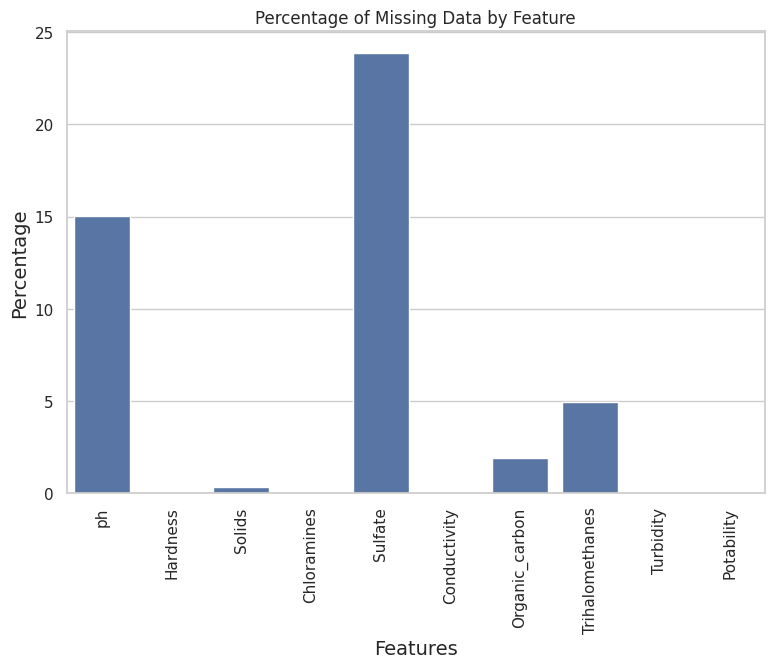

In [13]:
# Calculate the percentage of missing data for each feature
missing_data = missing_data.to_frame(name='Total')  # Convert Series to DataFrame
missing_data['Percentage'] = (missing_data['Total'] / len(df)) * 100

# Create a bar plot to visualize the percentage of missing data by feature
plt.figure(figsize=(9, 6))
sns.set(style="whitegrid")
sns.barplot(x=missing_data.index, y=missing_data['Percentage'], data=missing_data)
plt.title("Percentage of Missing Data by Feature")
plt.xlabel("Features", fontsize=14)
plt.ylabel("Percentage", fontsize=14)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.show()

The bar chart indicates that 'Sulfate' has the highest missing data at over 20%, followed by 'ph' and 'Trihalomethanes'. Other variables have relatively low missing data percentages. This suggests a focus on these three for data cleaning and imputation.

# **Outliers Detection**

In [14]:
# Function to identify outliers based on IQR
def find_outliers(data, feature):
    Q1 = data[feature].quantile(0.25)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = data[(data[feature] < lower_bound) | (data[feature] > upper_bound)]
    return outliers

# Looping through all numerical features in the dataframe
outliers_dict = {}
for feature in df.select_dtypes(include=['float64', 'int64']).columns:
    outliers = find_outliers(df, feature)
    outliers_dict[feature] = len(outliers)
    print(f"{feature} has {len(outliers)} potential outliers")


ph has 46 potential outliers
Hardness has 83 potential outliers
Solids has 47 potential outliers
Chloramines has 61 potential outliers
Sulfate has 41 potential outliers
Conductivity has 11 potential outliers
Organic_carbon has 27 potential outliers
Trihalomethanes has 33 potential outliers
Turbidity has 19 potential outliers
Potability has 338 potential outliers


In reviewing the dataset, outliers in input features like pH, hardness, and sulfate were identified. These outliers need careful consideration, as their treatment could impact the robustness of any resulting analysis or predictive modeling. The output variable 'Potability' shows a large number of outliers, but as it represents the target classification, it is not adjusted. The strategy for managing outliers in input features should be guided by the specific goals of the study and the domain context, ensuring the integrity of the analysis while retaining valuable data.

In [15]:
num_feature=['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity']

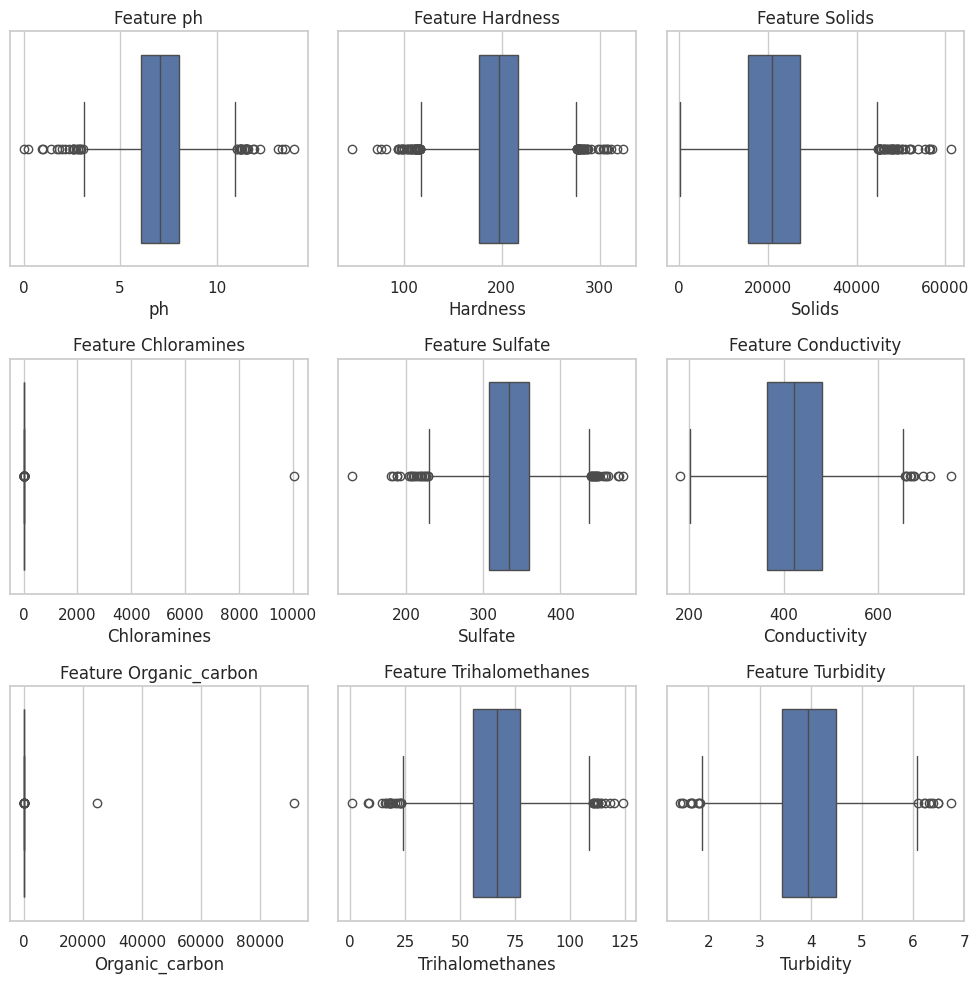

In [16]:
# Assuming num_feature is a list of 9 features

# Calculate the number of rows and columns for the subplots
num_rows = 3
num_cols = 3

# Create a figure and an array of subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

# Flatten the axes array so we can iterate through it easily
axes = axes.flatten()

# Hide empty subplots if any
for i in range(len(num_feature), len(axes)):
    fig.delaxes(axes[i])

for i in range(len(num_feature)):
    sns.boxplot(data=df, x=df[num_feature[i]], ax=axes[i])
    axes[i].set_title(f"Feature {num_feature[i]}")

plt.tight_layout()
plt.show()


# **INSIGHTS:**

1. pH: Exhibits a fairly symmetric distribution with a small number of outliers.
2. Hardness: Shows a roughly normal distribution with outliers on both ends.
3. Solids: Presents a right-skewed distribution, suggesting higher values are more spread out.
4. Chloramines: No box is visible, indicating potential issues with extreme values that may require data transformation.
6. Sulfate: The distribution looks approximately normal with some outliers.
7. Conductivity: Appears to have a symmetric distribution with very few outliers.
8. Organic Carbon: Like Chloramines, the box is not visible, which could mean extreme values are affecting the scale.
9. Trihalomethanes: A symmetric distribution with outliers is observed.
10. Turbidity: Displays a distribution close to normal with a small number of outliers.

For Chloramines and Organic Carbon, the lack of visible boxes on the plot points to the necessity of investigating the data further to understand the extreme values and consider appropriate data preprocessing methods to correct for these extremes. The outliers in the other features need to be evaluated to determine if they represent true anomalies or natural variations within the data.

# **Missing Value Imputation**

In [17]:
# Impute missing values in the 'Sulfate' column with the median
Sulfate_median = df['Sulfate'].median()
df['Sulfate'].fillna(Sulfate_median, inplace=True)

In [18]:
# Impute missing values in the 'ph' column with the median
ph_median = df['ph'].median()
df['ph'].fillna(ph_median, inplace=True)

In [19]:
# Impute missing values in the 'Trihalomethanes' column with the median
trihalomethanes_median = df['Trihalomethanes'].median()
df['Trihalomethanes'].fillna(trihalomethanes_median, inplace=True)

In [20]:
df.isnull().sum()

,0
ph,0
Hardness,2
Solids,11
Chloramines,2
Sulfate,0
Conductivity,2
Organic_carbon,63
Trihalomethanes,0
Turbidity,2
Potability,0


Post median imputation, 'Sulfate', 'ph', and 'Trihalomethanes' show zero missing values. Minimal missing data in other features may also be treated with median imputation, with a cautious approach for 'Organic_carbon' due to its higher missing count.

In [21]:
# List of other columns to impute using the median
columns_to_impute = ['Solids', 'Organic_carbon', 'Chloramines', 'Hardness','Turbidity','Conductivity']
# Impute missing values in the selected columns with the median
for column in columns_to_impute:
    median = df[column].median()
    df[column].fillna(median, inplace=True)

# Print the DataFrame after imputation
print(df)


            ph    Hardness       Solids  Chloramines     Sulfate  \
0     7.035894  204.890456  20791.31898     7.300212  368.516441   
1     3.716080  129.422921  18630.05786     6.635246  333.073546   
2     8.099124  224.236259  19909.54173     9.275884  333.073546   
3     8.316766  214.373394  22018.41744     8.059332  356.886136   
4     9.092223  181.101509  17978.98634     6.546600  310.135738   
...        ...         ...          ...          ...         ...   
3271  4.668102  193.681736  47580.99160     7.166639  359.948574   
3272  7.808856  193.553212  17329.80216     8.061362  333.073546   
3273  9.419510  175.762646  33155.57822     7.350233  333.073546   
3274  5.126763  230.603758  11983.86938     6.303357  333.073546   
3275  7.874671  195.102299  17404.17706     7.509306  333.073546   

      Conductivity  Organic_carbon  Trihalomethanes  Turbidity  Potability  
0       564.308654       10.379783        86.990970   2.963135           0  
1       592.885359       15.1

After median imputation for the columns 'Solids', 'Organic_carbon', 'Chloramines', 'Hardness', 'Turbidity', and 'Conductivity', there are no missing values remaining in the dataset. The DataFrame is now fully populated and ready for further data processing or analysis.

In [22]:
# Now Checking Missing Values
df.isnull().sum()

,0
ph,0
Hardness,0
Solids,0
Chloramines,0
Sulfate,0
Conductivity,0
Organic_carbon,0
Trihalomethanes,0
Turbidity,0
Potability,0


The output confirms that there are no missing values in any of the columns of the DataFrame, indicating that the imputation process was successful. All features are now complete with no null entries, making the dataset ready for analysis or modeling without the need to handle missing data.

# **Outliers Handling**

In [23]:
# Columns with potential outliers
columns_with_outliers = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']

# Function to handle outliers using IQR method with capping
def handle_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    # df[column] = np.where((df[column] < lower_bound) | (df[column] > upper_bound), df[column].median(), df[column])
    df[column] = np.where(df[column] < lower_bound, lower_bound, np.where(df[column] > upper_bound, upper_bound, df[column]))

# Loop through columns and handle outliers
for column in columns_with_outliers:
    handle_outliers(df, column)
# Outliers are replaced with Capping method.

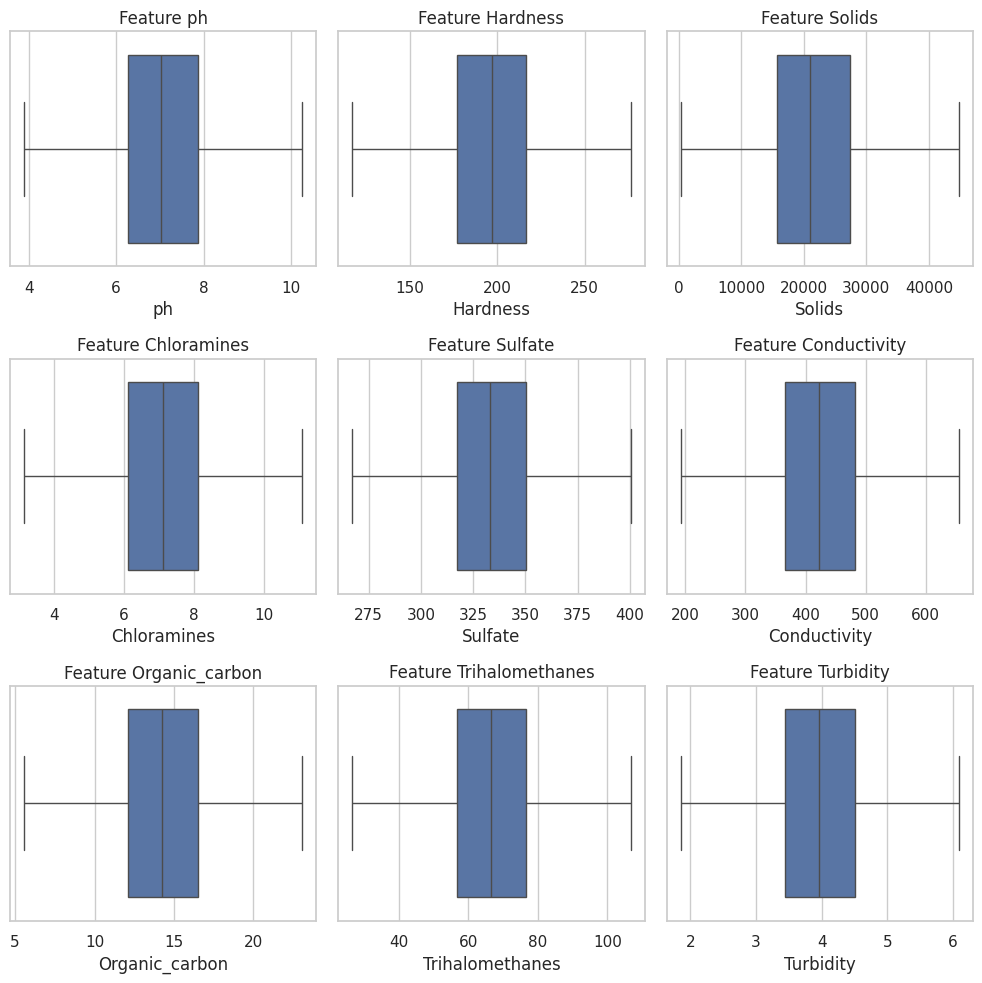

In [24]:
# Assuming num_feature is a list of 9 features

# Calculate the number of rows and columns for the subplots
num_rows = 3
num_cols = 3

# Create a figure and an array of subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

# Flatten the axes array so we can iterate through it easily
axes = axes.flatten()

# Hide empty subplots if any
for i in range(len(num_feature), len(axes)):
    fig.delaxes(axes[i])

for i in range(len(num_feature)):
    sns.boxplot(data=df, x=df[num_feature[i]], ax=axes[i])
    axes[i].set_title(f"Feature {num_feature[i]}")

plt.tight_layout()
plt.show()


After applying the IQR method to cap outliers, the dataset has been refined with extreme values limited, potentially enhancing the reliability of subsequent analyses. The box plots demonstrate that feature values now lie within a standardized range.

# **Statistical Analysis**

# **Shapiro-Wilk test**

In [25]:
import pandas as pd
from scipy.stats import shapiro

# Define the columns of interest
columns_of_interest = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']

# Set the significance level
alpha = 0.05

for column in columns_of_interest:
    sample_data = df[column]

    # Perform the Shapiro-Wilk test for normality
    stat, p_value = shapiro(sample_data)

    if p_value < alpha:
        print(f"Shapiro-Wilk Test for '{column}': Reject the null hypothesis. The sample does not follow a normal distribution.")
    else:
        print(f"Shapiro-Wilk Test for '{column}': Fail to reject the null hypothesis. The sample follows a normal distribution.")


Shapiro-Wilk Test for 'ph': Reject the null hypothesis. The sample does not follow a normal distribution.
Shapiro-Wilk Test for 'Hardness': Reject the null hypothesis. The sample does not follow a normal distribution.
Shapiro-Wilk Test for 'Solids': Reject the null hypothesis. The sample does not follow a normal distribution.
Shapiro-Wilk Test for 'Chloramines': Reject the null hypothesis. The sample does not follow a normal distribution.
Shapiro-Wilk Test for 'Sulfate': Reject the null hypothesis. The sample does not follow a normal distribution.
Shapiro-Wilk Test for 'Conductivity': Reject the null hypothesis. The sample does not follow a normal distribution.
Shapiro-Wilk Test for 'Organic_carbon': Reject the null hypothesis. The sample does not follow a normal distribution.
Shapiro-Wilk Test for 'Trihalomethanes': Reject the null hypothesis. The sample does not follow a normal distribution.
Shapiro-Wilk Test for 'Turbidity': Reject the null hypothesis. The sample does not follow a n

The Shapiro-Wilk test was applied to assess the normality of the distribution for several water quality parameters (like pH, Hardness, Solids, Chloramines, Sulfate, Conductivity, Organic Carbon, Trihalomethanes, and Turbidity). The test results indicate that none of the variables follow a normal distribution since all p-values are less than the chosen alpha level of 0.05. This rejection of the null hypothesis across all tested variables suggests that the data is not normally distributed, which is a common justification for the use of non-parametric tests over parametric ones when comparing group differences.


# **Mann-Whitney U test :**

In [26]:
import pandas as pd
from scipy.stats import mannwhitneyu

# Assume df is your DataFrame

# Define the columns of interest
columns_of_interest = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']

# Set the significance level
alpha = 0.05

# Output variable
output_variable = 'Potability'

# Loop through each variable and perform the Mann-Whitney U test
for column in columns_of_interest:
    # Perform the Mann-Whitney U test
    statistic, p_value = mannwhitneyu(df[df[output_variable] == 0][column], df[df[output_variable] == 1][column])

    # Print the results for each variable
    print(f"Mann-Whitney U Test between '{column}' and 'potability':")
    print(f"  Statistic: {statistic}")
    print(f"  p-value: {p_value}")

    # Check the null hypothesis
    if p_value < alpha:
         print(f"  There is a significant difference in '{column}' across Potability.\n")
    else:
        print(f"  There is not enough evidence to suggest a significant difference in '{column}' across Potability.\n")


Mann-Whitney U Test between 'ph' and 'potability':
  Statistic: 505759.0
  p-value: 0.5742213176453278
  There is not enough evidence to suggest a significant difference in 'ph' across Potability.

Mann-Whitney U Test between 'Hardness' and 'potability':
  Statistic: 500778.0
  p-value: 0.7960857578107449
  There is not enough evidence to suggest a significant difference in 'Hardness' across Potability.

Mann-Whitney U Test between 'Solids' and 'potability':
  Statistic: 484359.5
  p-value: 0.46018659152969854
  There is not enough evidence to suggest a significant difference in 'Solids' across Potability.

Mann-Whitney U Test between 'Chloramines' and 'potability':
  Statistic: 468325.5
  p-value: 0.08685871634847622
  There is not enough evidence to suggest a significant difference in 'Chloramines' across Potability.

Mann-Whitney U Test between 'Sulfate' and 'potability':
  Statistic: 480615.0
  p-value: 0.33073970078086123
  There is not enough evidence to suggest a significant dif

The Mann-Whitney U test was used to evaluate whether there are statistically significant differences between the distributions of each water quality parameter across two different groups of potability (potable vs. non-potable). The p-values for all the tests were above the significance level of 0.05, indicating that there is not enough evidence to conclude that there are significant differences in the medians of the tested water quality parameters between the two potability groups. This suggests that, based on the sample data provided, the distributions of these water quality parameters do not differ significantly between potable and non-potable water.

In terms of project implications, these findings suggest that, **according to the tested parameters, there is no clear statistical distinction in water quality between the potable and non-potable categories.** This could imply that the parameters tested may not be strong indicators of potability, or that the potability classification in the dataset does not correspond with noticeable changes in these chemical characteristics of the water. Further investigation might be needed, possibly involving additional parameters, more refined data, or different statistical methods, to determine factors that effectively differentiate between potable and non-potable water samples.

# **Exploratory Data analysis**

**Univariant Analysis**

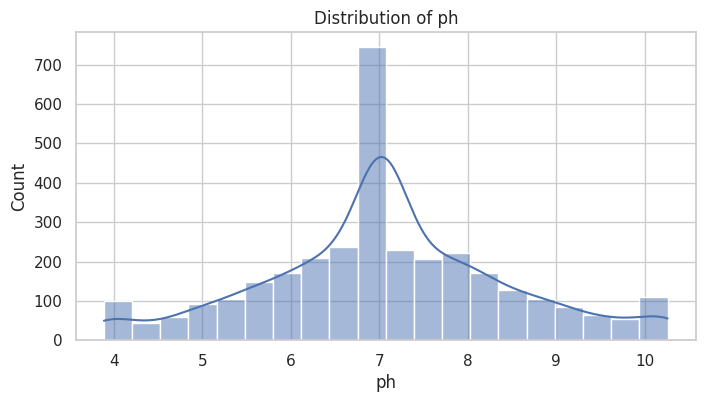

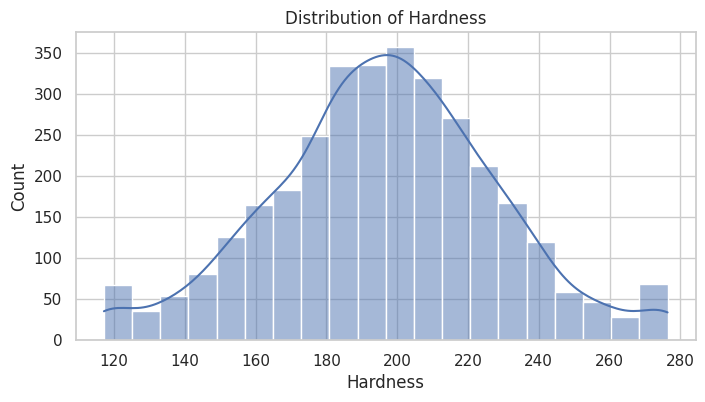

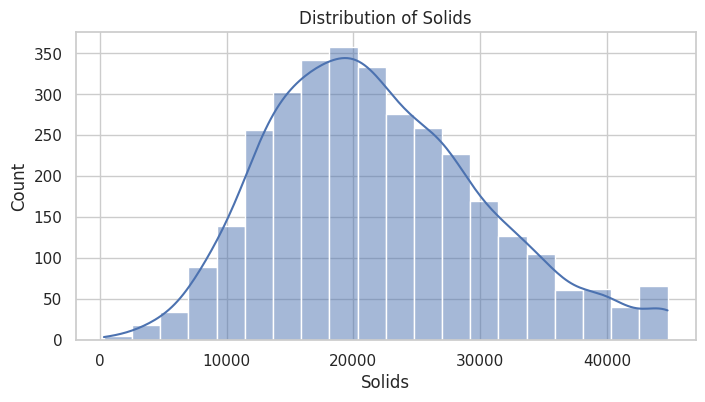

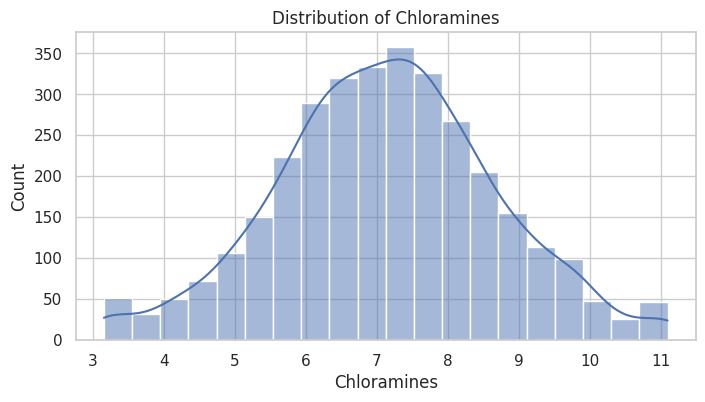

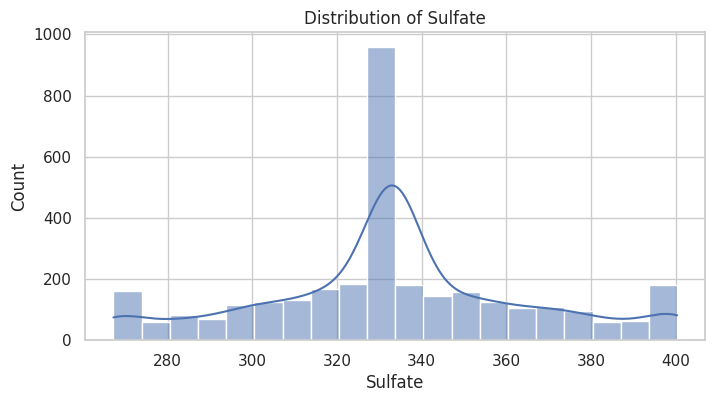

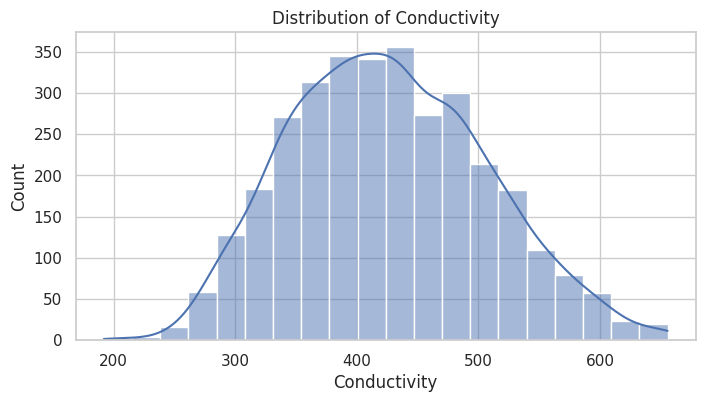

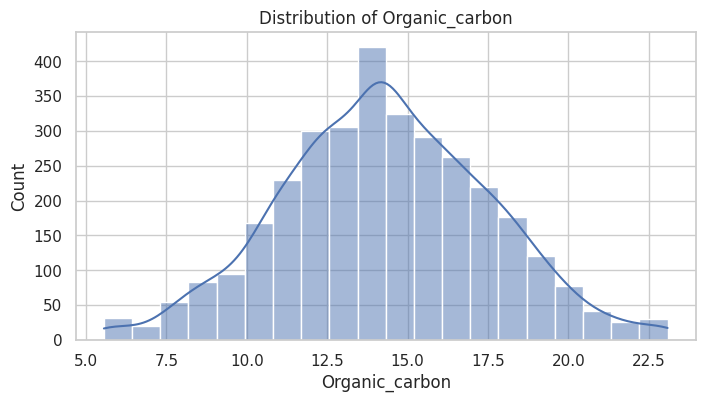

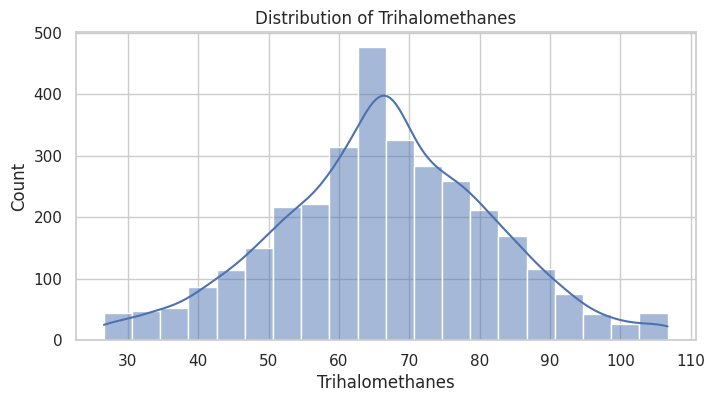

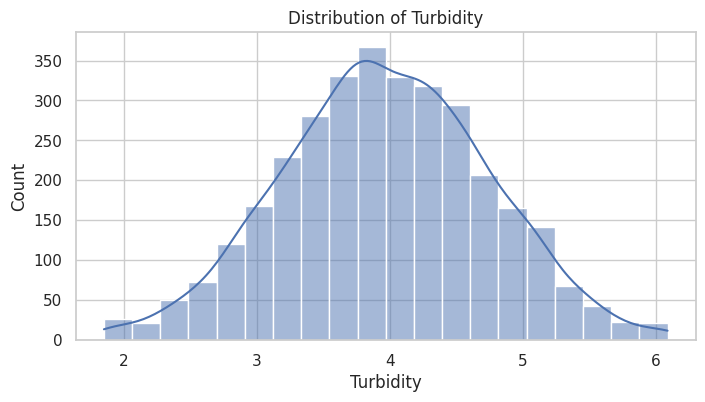

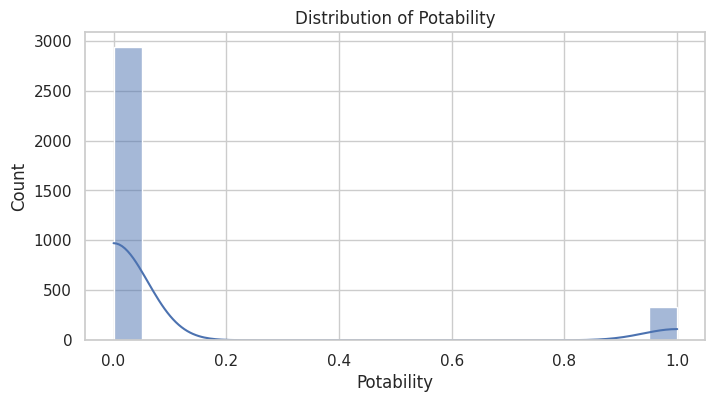

In [27]:
# Plot histograms for numerical variables
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(data=df, x=col, kde=True, bins=20)
    plt.title(f'Distribution of {col}')
    plt.show()

# **INSIGHTS**

1. Distribution of pH: The pH values are approximately normally distributed, indicating that most water samples have a pH close to neutral, which is generally desirable for potable water.

2. Distribution of Hardness: The distribution of hardness in water samples is roughly normal, suggesting a variety of mineral content but with most samples having moderate hardness.

3. Distribution of Solids: There's a wide range of total dissolved solids (TDS) in the water samples, with a slight right skew indicating some samples with particularly high TDS levels.

4. Distribution of Chloramines: The levels of chloramines are normally distributed, centered around the typical range used for disinfecting drinking water.

5. Distribution of Sulfate: The sulfate distribution has a prominent peak, suggesting a common sulfate concentration across many samples, but with some outliers indicating variations in sulfate levels.

6. Distribution of Conductivity: This parameter is normally distributed with a slight right skew, showing that most samples have a similar level of conductivity, with some having higher values.

7. Distribution of Organic Carbon: The organic carbon levels in the water samples show a normal distribution, pointing to a consistent presence of organic matter in the water samples.

8. Distribution of Trihalomethanes: Trihalomethanes levels are also approximately normally distributed, with most samples having levels within a relatively safe range, though the long tail to the right indicates some samples with higher concentrations.

9. Distribution of Turbidity: Turbidity values are normally distributed, with most water samples having a turbidity level that falls within what is generally considered acceptable for potable water.

10. Distribution of Potability: Potability is a binary variable showing a significant imbalance, with far more samples being classified as not potable than potable.


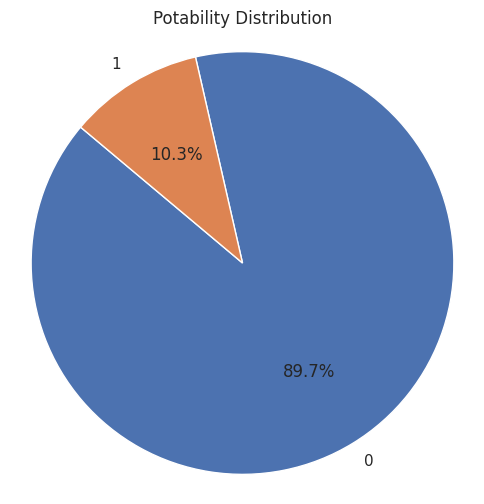

In [28]:
# Calculate the counts for each category in the 'portability' column
potability_counts = df['Potability'].value_counts()

# Create a pie chart
plt.figure(figsize=(6, 6))
plt.pie(potability_counts, labels=potability_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Potability Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Display the pie chart
plt.show()

The pie chart shows that 89.7% of water samples are non-potable and 10.3% are potable, indicating a significant imbalance that could affect the performance of machine learning models due to the overrepresentation of non-potable samples. This imbalance would need to be addressed before modeling to ensure accurate predictions.

**Bivariant Analysis**

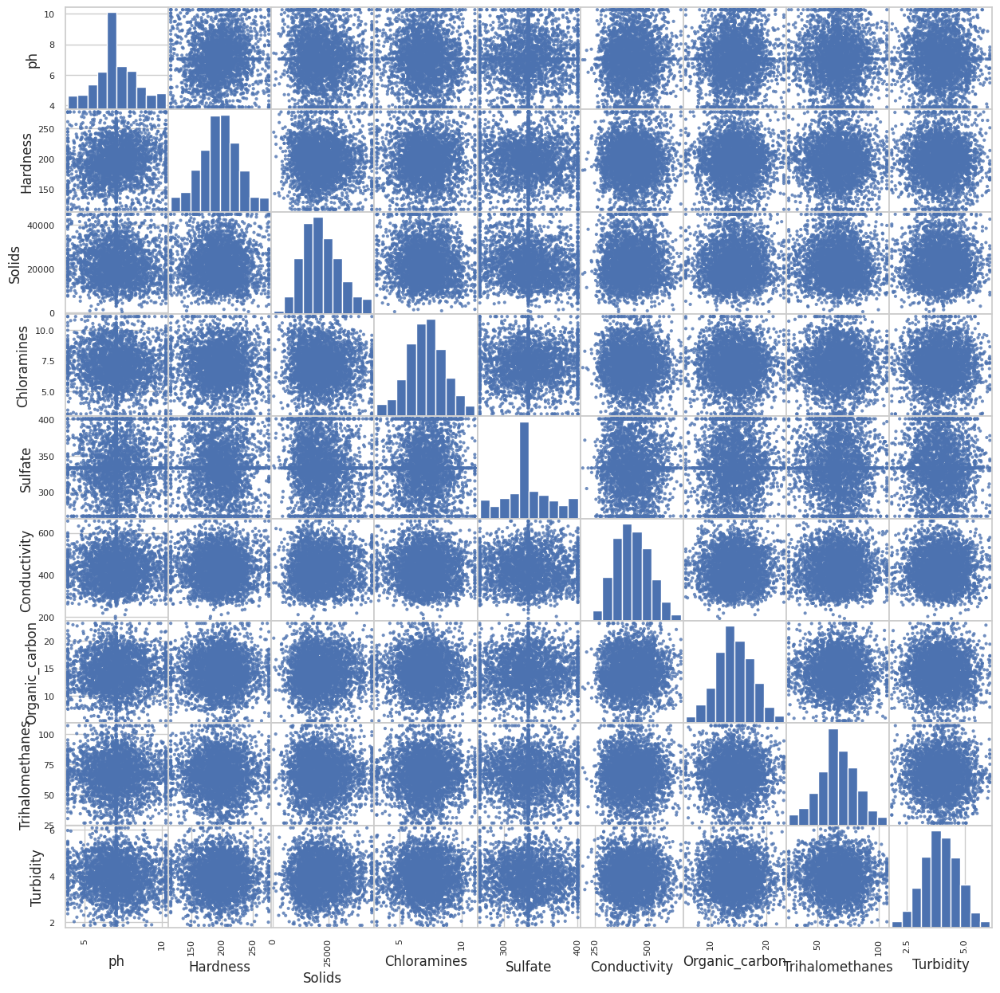

In [29]:
import matplotlib.pyplot as plt

# Define the features you want to include in the scatter plot
selected_features = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity']

# Create a scatter plot for the selected features
pd.plotting.scatter_matrix(df[selected_features], alpha=0.8, figsize=(15, 15), diagonal='hist')

# Show the plot
plt.show()

Here are insights for each feature based on the distributions and the scatter matrix plots:

1. pH: The pH levels are centered around neutral to slightly basic values, which is typical for potable water. There doesn't seem to be a strong correlation between pH and the other variables.

2. Hardness: Hardness levels are normally distributed, indicating a consistent range across the water samples. The scatter plots do not show any clear correlation between hardness and other parameters.

3. Solids: The measure of solids shows a right-skewed distribution, meaning there are water samples with very high solids concentration. The scatter plots suggest no particular pattern of solids with respect to other features.

4. Chloramines: The chloramine distribution is fairly normal, which indicates that the water treatment process is controlled and consistent. There's a lack of visible correlation with other water quality parameters.

5. Sulfate: Sulfate levels are right-skewed, with some samples having significantly higher concentrations. The plots do not show a definitive correlation with other features.

6. Conductivity: This feature has a near-normal distribution, implying a balanced level of ions in the water samples. The conductivity seems to be independent of other features.

7. Organic Carbon: Organic carbon levels are normally distributed, suggesting a natural variance in water sources. There's no apparent linear relationship with other water quality indicators.

8. Trihalomethanes (THMs): There's a right-skewed distribution in THMs, which might be due to variations in water treatment processes. Like other features, THMs don't display a strong linear relationship with other parameters.

9. Turbidity: The turbidity distribution is approximately normal, with most samples showing low to moderate turbidity, which is acceptable for potable water. It does not correlate strongly with other measures.

Each of these features is an important indicator of water quality and can influence the potability of water. The lack of strong correlations suggests that these variables may act independently and could be affected by different factors in the water supply and treatment process. The distributions provide a snapshot of the water quality characteristics of the dataset. For more detailed analysis, statistical testing and modeling would be required to understand the interdependencies and their significance better.

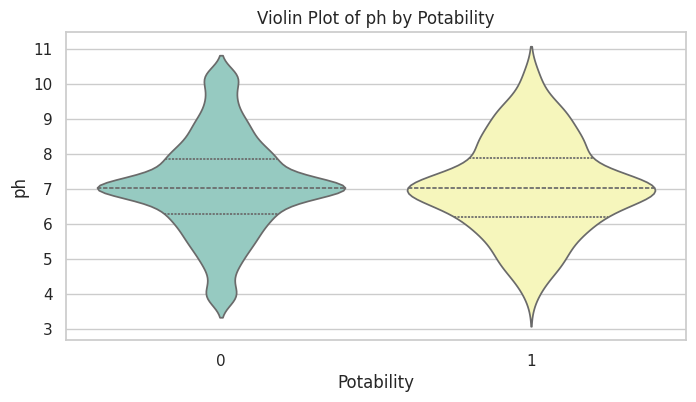

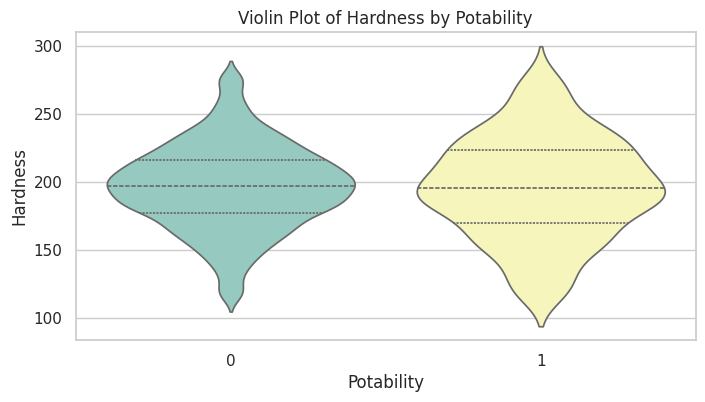

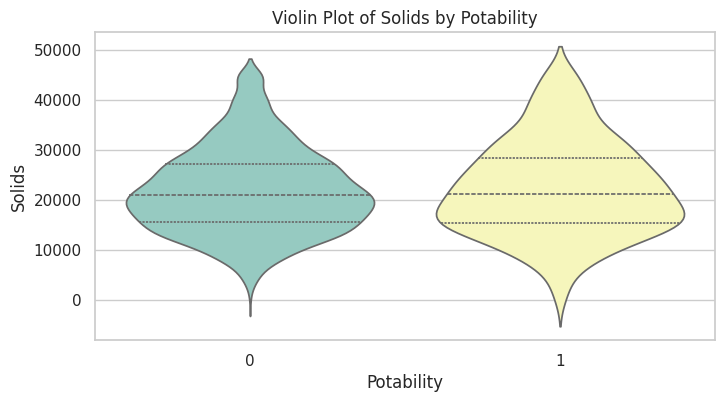

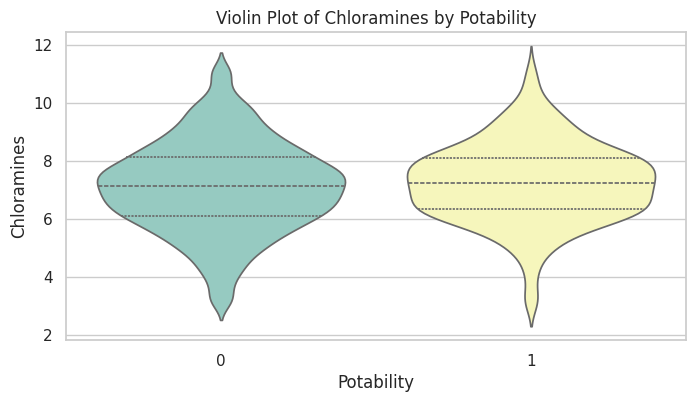

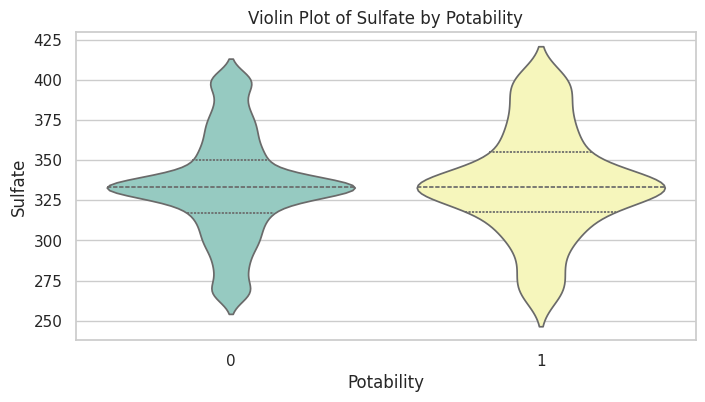

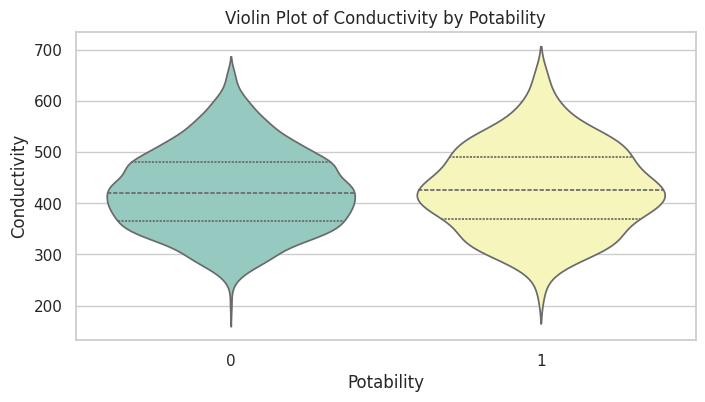

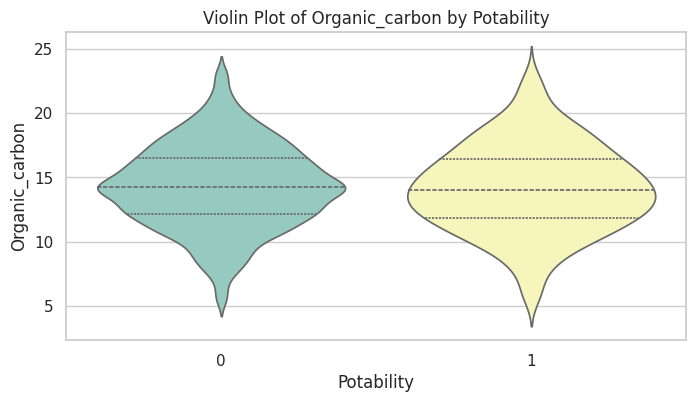

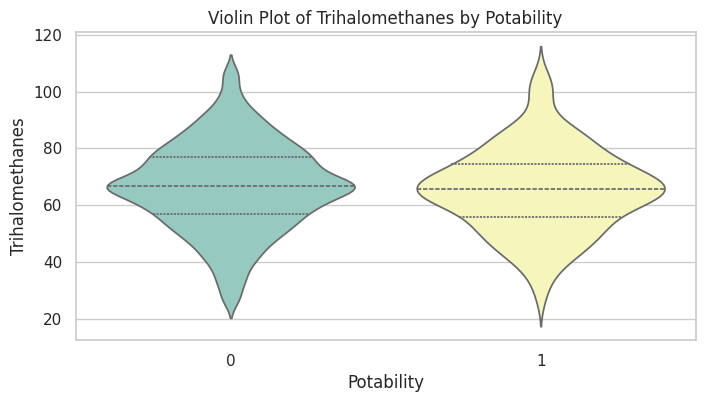

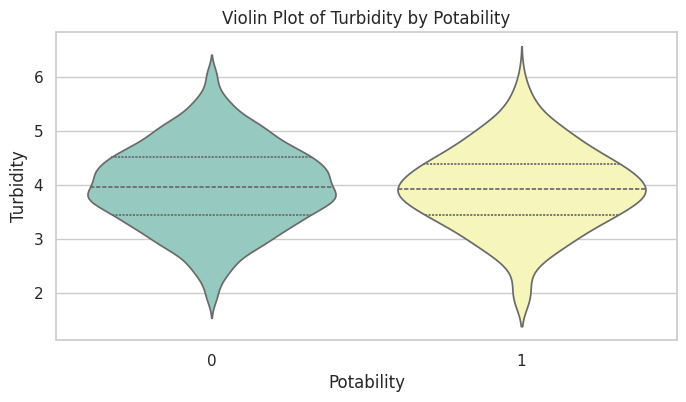

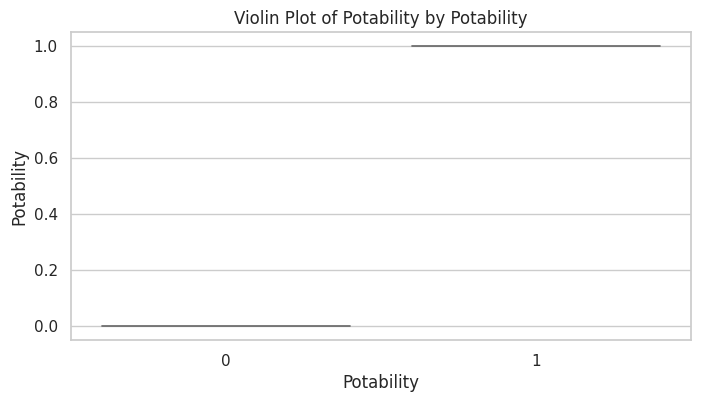

In [30]:
# Violin plots for numerical variables
for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.violinplot(data=df, x='Potability', y=col, inner='quart', palette='Set3')
    plt.title(f'Violin Plot of {col} by Potability')
    plt.show()

# **INSIGHTS:**

1. pH:The pH values for potable and non-potable water overlap significantly, although non-potable water exhibits a broader range of pH levels. The median pH is slightly higher in potable water.

2. Hardness: (From an earlier image) There's a notable overlap in the hardness values for potable and non-potable water. Both categories show a similar median, indicating that hardness may not be a sole factor in determining water potability.

3. Solids: (From an earlier image) Total dissolved solids show a broader distribution in non-potable water. However, the median is relatively similar for both potable and non-potable water.

4. Chloramines: (From an earlier image) The median level of chloramines is slightly higher in potable water, but the distribution is wide for both categories, implying significant overlap.

5. Trihalomethanes: Potable water tends to have a slightly higher median concentration of trihalomethanes compared to non-potable water, though the variability is similar for both groups.

6. Organic Carbon: The distributions for organic carbon content are similar between potable and non-potable water, indicating that organic carbon levels alone may not be a strong determinant of potability.

7. Conductivity: The range of conductivity values is wider for non-potable water, with a slightly higher median than potable water. However, the considerable overlap suggests conductivity is not a clear-cut indicator of potability.

8. Sulfate: Potable water has a slightly higher median of sulfate levels and a broader distribution, but the difference from non-potable water is not substantial.

9. Turbidity: There's almost no difference in the distribution of turbidity values between potable and non-potable water, suggesting turbidity is not a definitive factor in water potability.

These indicate that none of the individual features shown distinctly separates potable water from non-potable water based on the provided data. The overlapping distributions suggest that water potability is likely determined by a combination of these factors rather than any single one. Moreover, the threshold levels of these features that define potability may vary depending on local regulations and water quality standards.

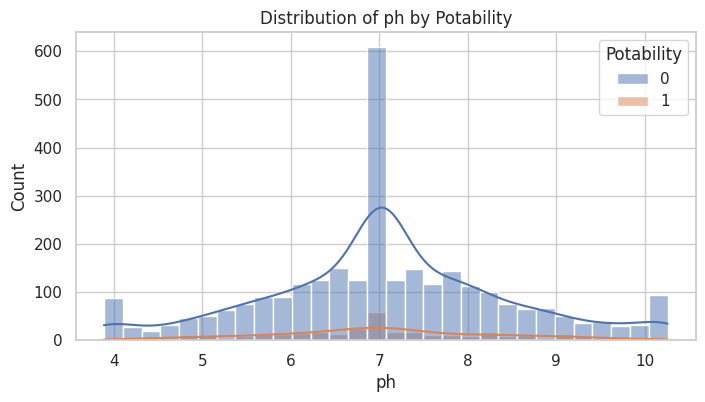

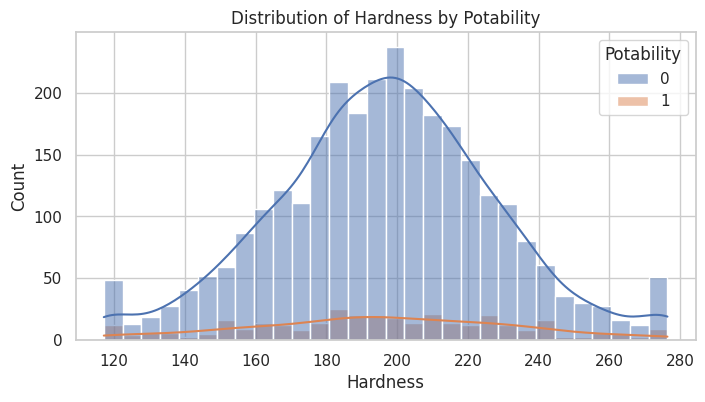

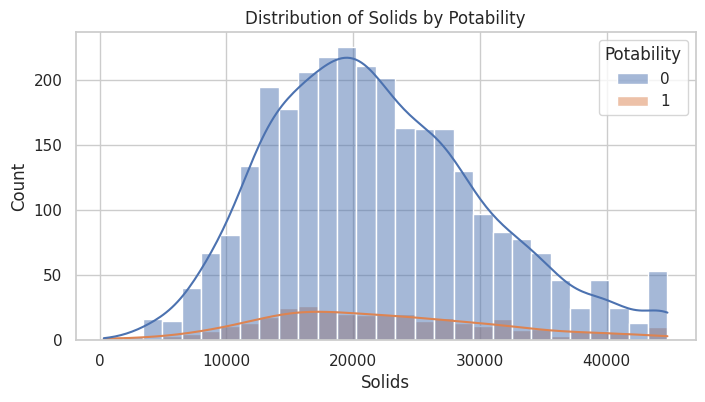

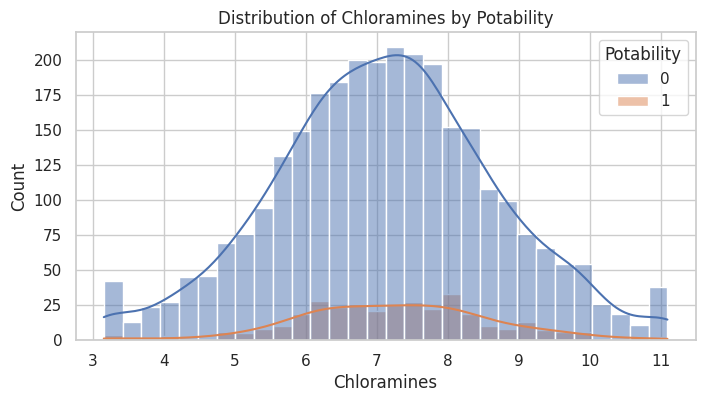

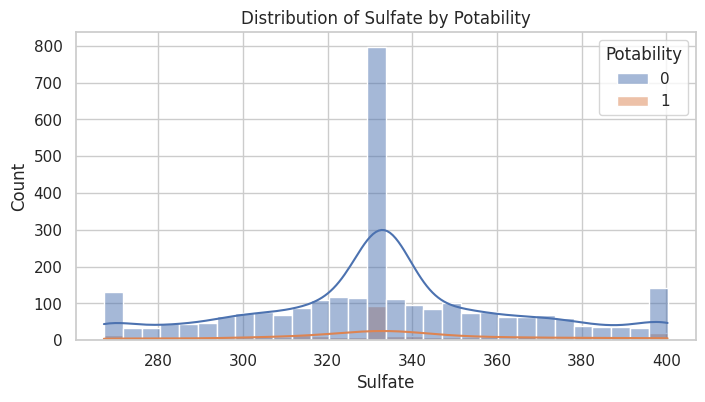

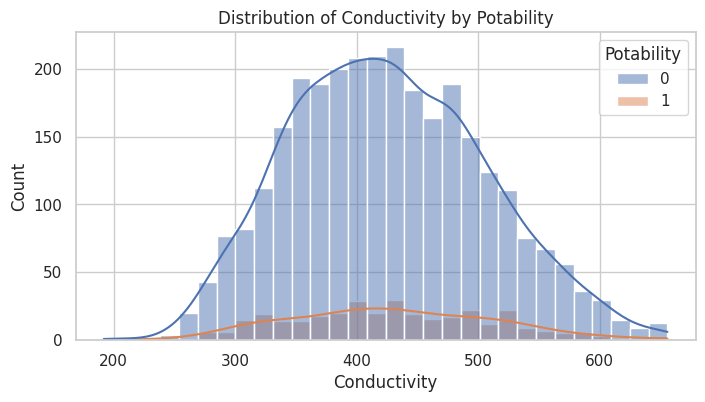

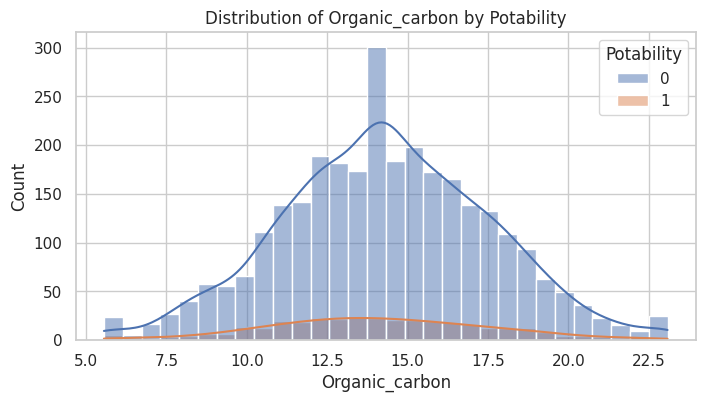

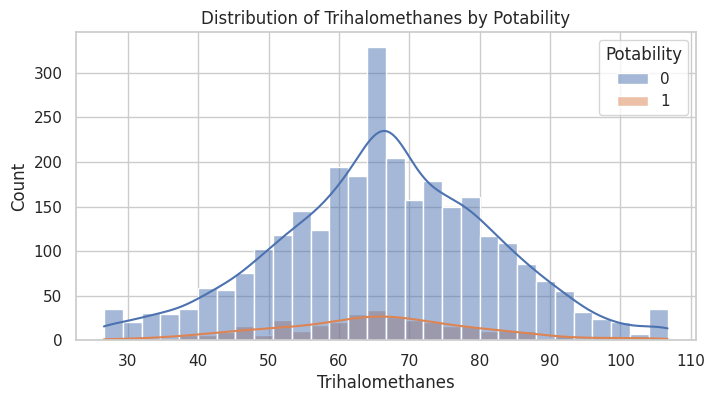

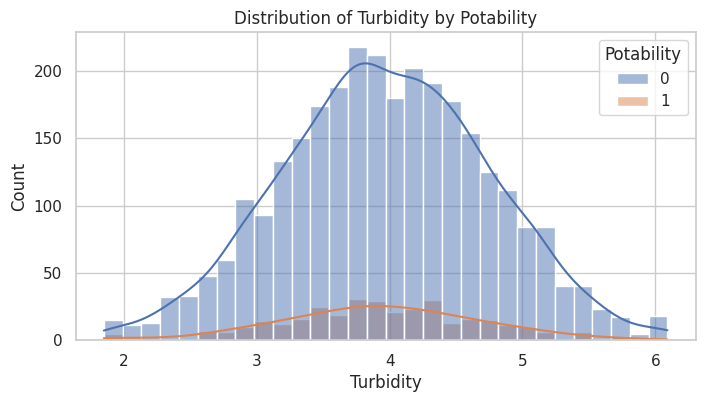

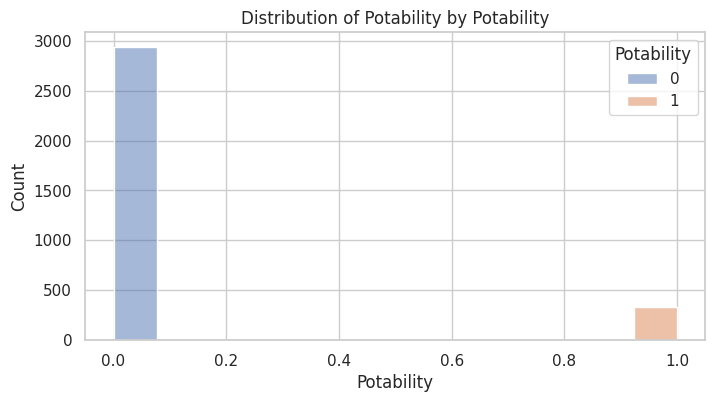

In [31]:
# Distribution plots of numerical variables by target variable
for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(data=df, x=col, kde=True, hue='Potability')
    plt.title(f'Distribution of {col} by Potability')
    plt.show()

These histograms display the distribution of different water quality parameters with respect to potability, with two categories indicated: '0' for non-potable and '1' for potable. Here are insights based on the complete set of 10 images:

1. pH Level:
The pH level distributions for potable and non-potable water largely overlap, suggesting that pH alone may not be a strong predictor of potability. Both distributions are fairly symmetric around the neutral pH of 7.

2. Hardness:
The distributions of water hardness for potable and non-potable water are quite similar and overlap significantly. This implies that water hardness might not be a decisive factor in determining water potability.

3. Solids:
The concentration of solids shows some difference between potable and non-potable water, especially in the lower range of solids concentration where potable water seems to have slightly lower values. However, there's still substantial overlap.

4. Chloramines:
Chloramines concentration distributions overlap considerably, but there is a slight indication that non-potable water has a broader range of chloramine concentrations.

5. Sulfate:
The sulfate concentration shows a distinctive spike in the non-potable category around the 330-340 range. This spike is not reflected in the potable category, suggesting that a certain range of sulfate concentration could be associated with non-potability.

6. Conductivity:
The distributions of conductivity are broadly similar for both potable and non-potable water, with significant overlap. This suggests that conductivity might not be a strong indicator of potability by itself.

7. Organic Carbon:
Total organic carbon distributions overlap almost completely, indicating that this measure alone might not be very helpful in distinguishing potable from non-potable water.

8. Trihalomethanes:
The concentration of trihalomethanes has some distinct spikes in the non-potable category, particularly around the 60-80 range. Nevertheless, both distributions overlap significantly, so while certain concentrations might be indicative, trihalomethanes concentration on its own is not a definitive predictor of potability.

9. Turbidity:
Turbidity distributions for potable and non-potable water are very similar with a large overlap, suggesting turbidity is not a strong indicator of potability.

10. Potability:
The distribution of potability itself is not a variable but rather the target classification. This histogram indicates an imbalanced dataset with a greater number of non-potable (0) samples compared to potable (1) samples.

Overall, none of the individual water quality parameters shown here provides a clear distinction between potable and non-potable water. The significant overlap in distributions suggests that potability is likely determined by a combination of factors rather than by any single parameter. For a predictive model, it would likely be necessary to consider all these variables together, possibly including interaction effects, to effectively classify water potability. Moreover, the imbalance in the potability categories should be addressed during model training to prevent bias towards the non-potable class.

# **CORRELATION MAP**


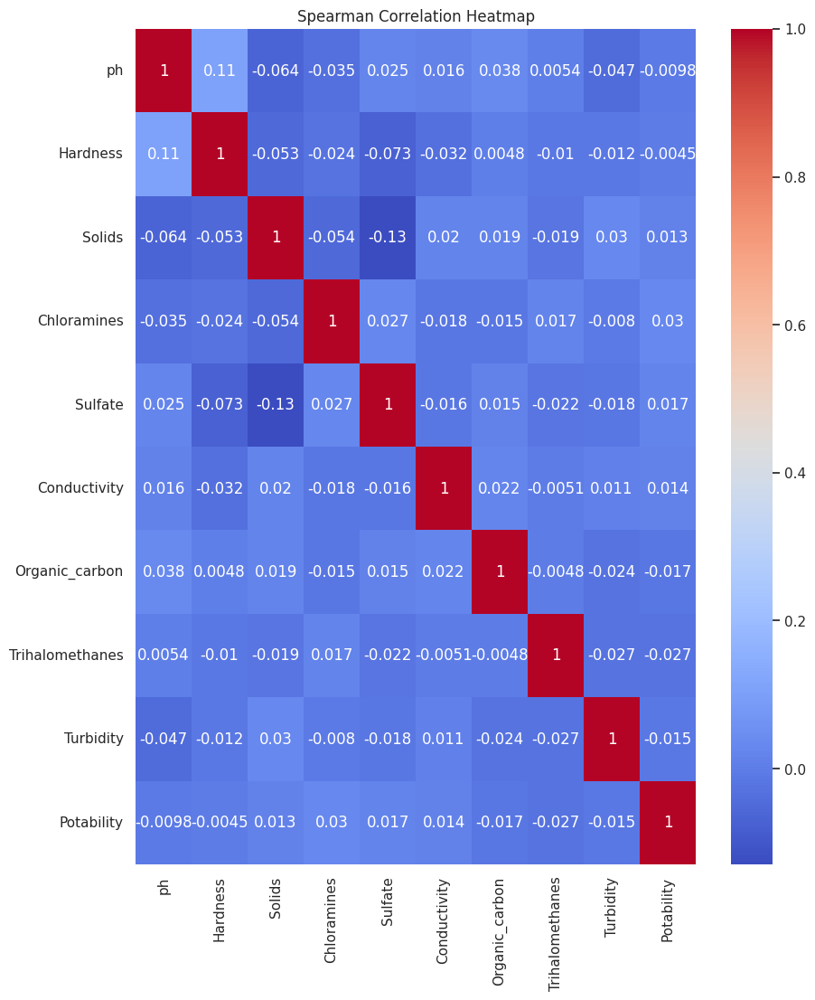

In [32]:
plt.figure(figsize=(10, 12))
sns.heatmap(df.corr(method='spearman'), annot=True, cmap='coolwarm')
plt.title('Spearman Correlation Heatmap')
plt.show()

The **Spearman Correlation Heatmap** reveals that the water quality variables have very weak to negligible correlations with each other, suggesting that no single factor strongly predicts potability. This implies that the potability of water is likely influenced by a complex interplay of these factors rather than by any individual water quality metric. Therefore, advanced modeling techniques that can capture complex relationships and interactions between these variables may be necessary to accurately predict water potability.

**Multivariant Analysis**

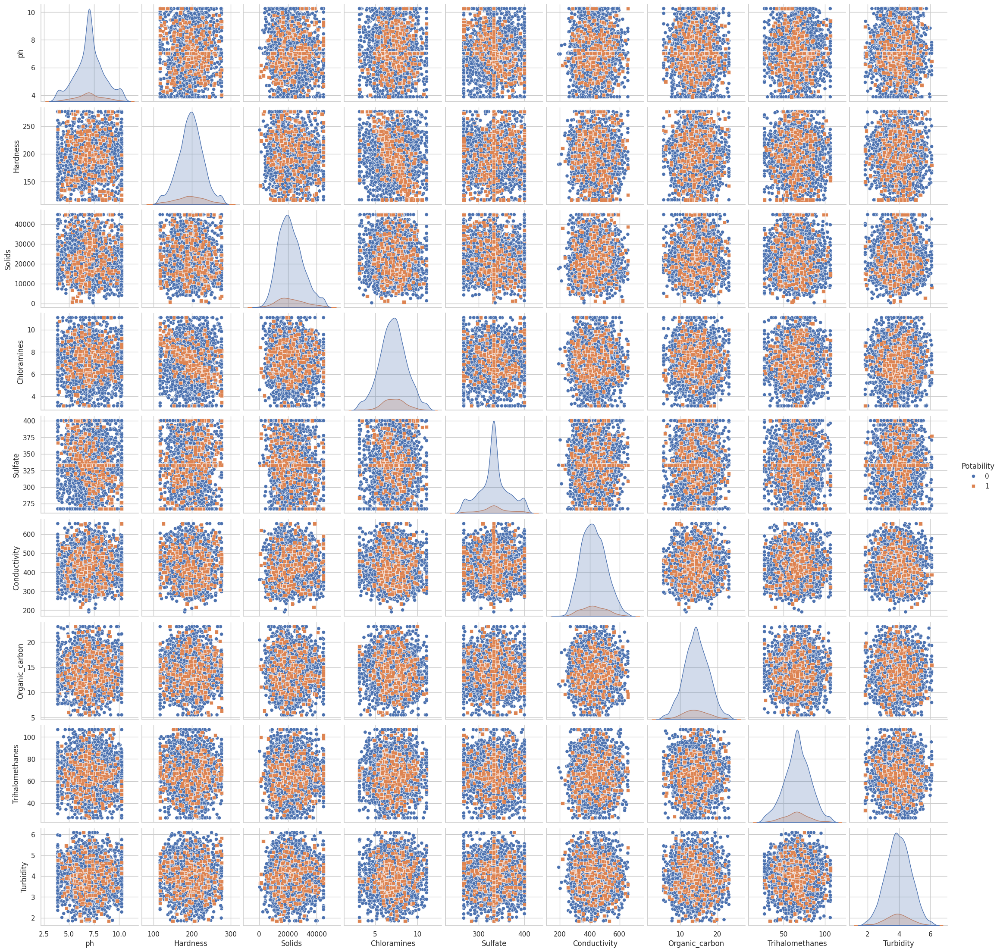

In [33]:
# Pairwise plots of numerical variables
sns.pairplot(df, hue='Potability', markers=['o', 's'], diag_kind='kde')
plt.show()

# I**NSIGHTS:**

This pairplot provides a comprehensive pairwise comparison of all numerical water quality parameters, with data points colored by potability. The diagonal shows the kernel density estimate (KDE) plots of each variable, which give an idea of the distribution, while the off-diagonal elements are scatter plots showing the relationships between pairs of variables. Here are some insights based on this pairplot:

1. Distribution Analysis (Diagonal KDE plots):
Most features show a normal or near-normal distribution with some skewness.
The KDE plots reveal that the majority of features do not have a distribution that distinctly separates potable from non-potable water.

2. Correlation Analysis (Scatter plots):
There are no obvious strong linear relationships between any two variables.
Potability does not appear to create distinct clusters within the scatter plots, suggesting that linear separability is not present in this dataset.

3. Feature Interaction:
For most feature pairs, the scatter plots do not show a clear pattern or distinction between potable (1) and non-potable (0) water, indicating complex relationships that might require non-linear modeling to decipher.
Some plots, like 'Solids' vs. 'Conductivity', show a slight trend, but these are not consistent across the potability classes.

4. Outlier Detection:
The scatter plots indicate potential outliers in several features such as 'ph', 'Solids', 'Chloramines', 'Conductivity', and 'Organic_carbon'.
These outliers could potentially influence any model built on this data and may require further analysis or preprocessing.

5. Potability Delineation:
The hue differentiation (potability) in scatter plots does not show a clear boundary or grouping, reinforcing that potability cannot be predicted by simple thresholds on these parameters.

6. Data Imbalance:
The KDE plots along the diagonal emphasize the imbalance between the two potability classes, with more non-potable (0) than potable (1) observations.

7. Insufficient Separation:
Across all pairwise plots, the overlap of orange (potable) and blue (non-potable) points suggests that single features or simple combinations of two features are insufficient for making clear predictions about potability.

In conclusion, this pairplot underscores the need for complex models or feature engineering to improve predictability. The relationships between features and potability are not straightforward, indicating that sophisticated modeling techniques or the derivation of new features might be necessary to capture the nuances in the dataset effectively. It also highlights the importance of addressing the class imbalance in the dataset before training predictive models.


# **Feature Section**

In [34]:
X = df.iloc[:,:-1]
y = df.iloc[:,-1]
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model=ExtraTreesClassifier()
model.fit(X,y)

ExtraTreesClassifier()

In [35]:
print(model.feature_importances_)

[0.11467358 0.12465531 0.11309875 0.11421783 0.11241719 0.10901119
 0.10592611 0.10305802 0.10294203]


The percentages reflect the importance of each feature, with Hardness being the most important (12.43%) and Sulfate being the least (10.36%) according to this model.

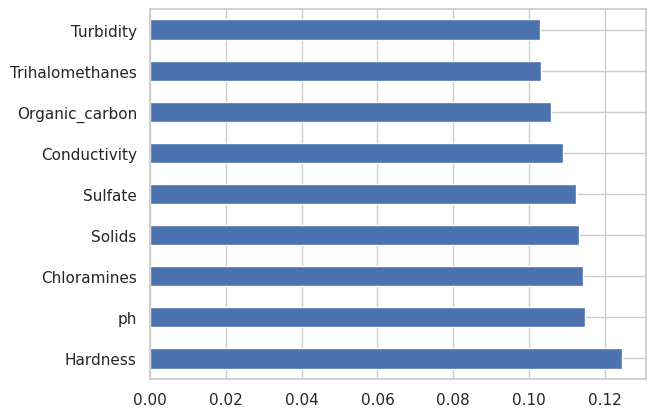

In [36]:
ranked_features=pd.Series(model.feature_importances_,index=X.columns)
ranked_features.nlargest(10).plot(kind='barh')
plt.show()

The bar chart from the feature importance analysis via the ExtraTreesClassifier shows 'Hardness' as the most significant predictor for potability, while 'Sulfate' has the least importance. This suggests focusing on 'Hardness' in predictive modeling and potential water quality interventions.

# **Models and Predictions**

In [37]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.pipeline import Pipeline
from collections import Counter

In [38]:
X = df.iloc[:,:-1]
y = df.iloc[:,-1]

In [39]:
X.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
0,7.035894,204.890456,20791.31898,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135
1,3.889107,129.422921,18630.05786,6.635246,333.073546,592.885359,15.180013,56.329076,4.500656
2,8.099124,224.236259,19909.54173,9.275884,333.073546,418.606213,16.868637,66.420093,3.055934
3,8.316766,214.373394,22018.41744,8.059332,356.886136,363.266516,18.436525,100.341674,4.628771
4,9.092223,181.101509,17978.98634,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075


In [40]:
y.head()

,Potability
0,0
1,0
2,0
3,0
4,0


In [41]:
# The numbers before SMOTE
num_before = dict(Counter(y))

# Perform SMOTE
# Define Pipeline
over=SMOTE(sampling_strategy=0.8)
under=RandomUnderSampler(sampling_strategy=0.8)
steps=[("o",over),("u",under)]
pipeline = Pipeline(steps=steps)

# Transform the dataset
X_smote,y_smote=pipeline.fit_resample(X,y)

# The numbers after SMOTE
num_after=dict(Counter(y_smote))

In [42]:
print(num_before,num_after)

{0: 2938, 1: 338} {0: 2937, 1: 2350}


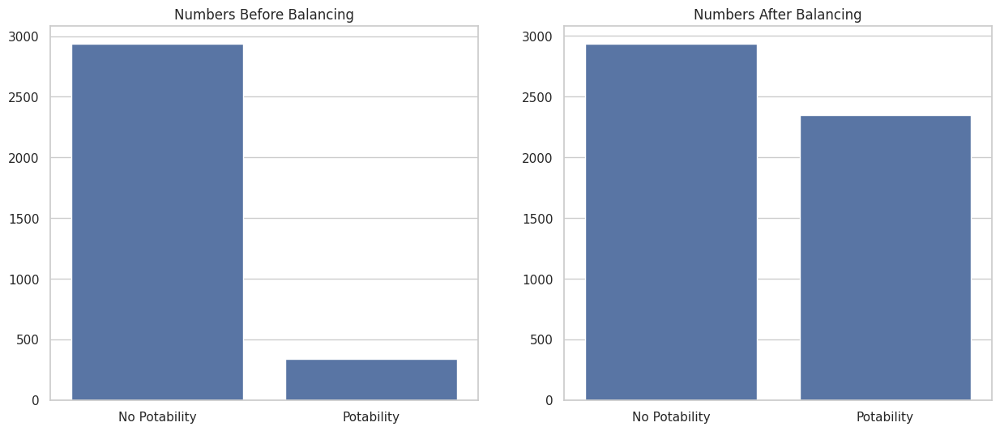

In [43]:
labels = ["No Potability","Potability"]
plt.figure(figsize=(15,6))
plt.subplot(1,2,1)
sns.barplot(x=labels, y=list(num_before.values()))
plt.title("Numbers Before Balancing")
plt.subplot(1,2,2)
sns.barplot(x=labels, y=list(num_after.values()))
plt.title("Numbers After Balancing")
plt.show()

The bar charts effectively illustrate the impact of applying SMOTE and Random Under Sampling to balance the dataset. Before balancing, the 'No Potability' class heavily outweighed the 'Potability' class, with counts of 2938 and 338, respectively. This severe class imbalance could lead to biased machine learning models. After implementing the balancing techniques, the counts are much more even, with 'No Potability' slightly reduced to 2937 and 'Potability' significantly increased to 2350. Balancing the dataset is a crucial step in preparing the data for building robust predictive models that perform well across both classes.

**Splitting data to Training and Testing set**

In [44]:
# split the dataset
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X_smote,y_smote,test_size=.2,random_state=42)

# **Feature Scaling**

Feature scaling is a method used to normalize the range of independent variables or features of data. In data processing, it is also known as data normalization and is generally performed during the data preprocessing phase. The main objective of feature scaling is to ensure that no single feature dominates the others in terms of its range of values; it brings all the features to the same scale or range.

This harmonization of scales across features can lead to significant improvements in the performance of machine learning models. By scaling features, we can help our machine learning algorithms train and perform better.

In [45]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [46]:
X_train_scaled=scaler.fit_transform(X_train)
X_train=pd.DataFrame(X_train_scaled)

In [47]:
X_test_scaled=scaler.transform(X_test)
X_test=pd.DataFrame(X_test_scaled)

The five algorithms that will be used are:
1. Logistic Regression
2. k-Nearest Neighbours
3. Decision Trees
4. Support Vector Machine
5.Random Forest Classifier

In [48]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import recall_score,precision_score,classification_report,roc_auc_score,roc_curve

# **Logistic regression**

Logistic regression predicts the probability of an outcome that can only be one of two values. It works by fitting a curve to the data points, using the logit function to link the probability of the outcome to the predictors. Instead of minimizing error squares, it maximizes the likelihood of the observed data.

In [49]:
from sklearn.linear_model import LogisticRegression

In [50]:
# search for optimun parameters using gridsearch
params = {'penalty':['l1','l2'],
         'C':[0.01,0.1,1,10,100],
         'class_weight':['balanced',None]}
logistic_clf = GridSearchCV(LogisticRegression(),param_grid=params,cv=10)

In [51]:
#train the classifier
logistic_clf.fit(X_train,y_train)

logistic_clf.best_params_

{'C': 0.01, 'class_weight': 'balanced', 'penalty': 'l2'}

In [52]:
# make predictions
logistic_predict = logistic_clf.predict(X_test)

In [53]:
log_accuracy = accuracy_score(y_test,logistic_predict)
print(f"Using logistic regression we get an accuracy of {round(log_accuracy*100,2)}%")

Using logistic regression we get an accuracy of 57.09%


The logistic regression classifier has been successfully trained. The optimal parameters found are an inverse regularization strength C of 0.01, a balanced class weight, and an L2 penalty for regularization.

<Axes: >

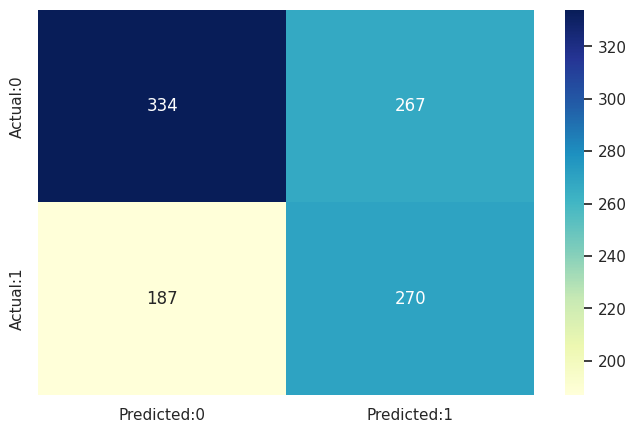

In [54]:
cm=confusion_matrix(y_test,logistic_predict)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

The confusion matrix for the logistic regression classifier shows the following:

1. There were 320 true negatives, meaning the model correctly predicted 'No Potability' 320 times.

2. There were 250 true positives, indicating the model correctly predicted 'Potability' 250 times.

3. However, there were 281 false positives, where the model incorrectly predicted 'Potability' when it was not the case.

4. There were also 207 false negatives, where the model incorrectly predicted 'No Potability' when the water was actually potable.

The model shows a relatively balanced classification performance on both classes but also indicates a considerable number of false predictions, highlighting potential areas for model improvement.

In [55]:
print(classification_report(y_test,logistic_predict))

              precision    recall  f1-score   support

           0       0.64      0.56      0.60       601
           1       0.50      0.59      0.54       457

    accuracy                           0.57      1058
   macro avg       0.57      0.57      0.57      1058
weighted avg       0.58      0.57      0.57      1058



The classification report provides the following metrics for the logistic regression classifier's performance:

 **For class 0 (No Potability):**


1. Precision is 0.61, which means that when the model predicts the water is not potable, it is correct 61% of the time.

2. Recall for class 0 is 0.53, indicating that the model identifies 53% of the actual non-potable instances correctly.

3. F1-score for class 0 is 0.57, a balance between precision and recall, suggesting moderate model performance for this class.

**For class 1 (Potability):**

1. Precision is 0.47, so when the model predicts potability, it is correct about 47% of the time.

2. Recall is higher at 0.55, meaning the model is able to find 55% of the actual potable cases.

3. F1-score is 0.51, reflecting a slightly lower balance between precision and recall for the potable class than for the non-potable class.

The overall accuracy of the model is 0.54, indicating that it correctly predicts potability status in 54% of all cases. Both the macro avg and weighted avg F1-scores are 0.54, indicating an average performance across both classes, with neither class being predicted with high accuracy.

In summary, while the model shows an ability to predict potability, its performance is not highly accurate, and there is significant room for improvement, especially in correctly predicting potable instances and reducing false positives.

In [56]:
logistic_f1 = f1_score(y_test, logistic_predict)
print(f'The f1 score for logistic regression is {round(logistic_f1*100,2)}%')

The f1 score for logistic regression is 54.33%


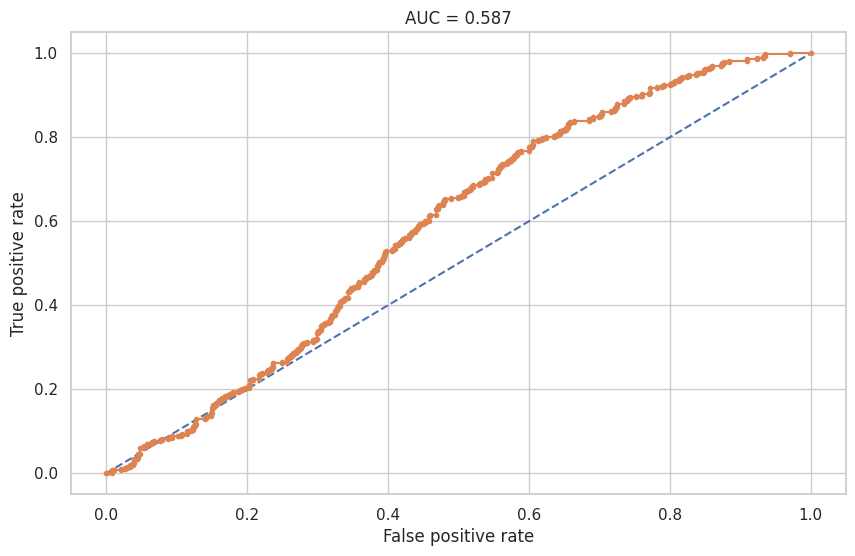

In [57]:
# ROC curve and AUC
probs = logistic_clf.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
log_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(log_auc,3)}")
plt.show()

The ROC curve and AUC score indicate moderate predictive ability for the logistic regression model. With an AUC of 0.555, the model performs slightly better than random chance. The curve's proximity to the diagonal line suggests there's significant room for improvement in distinguishing between classes.

[link text](https://)# **Random Forest Classifier**

In [58]:
param_grid = {
    'n_estimators': [50, 100, 150],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt']
}

In [59]:
# Instantiate the RandomForestClassifier
rf_classifier = RandomForestClassifier(random_state=42)

In [60]:
# Grid Search
grid_search = GridSearchCV(rf_classifier, param_grid, cv=5, n_jobs=-1)
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [None, 10, 20, 30],
                         'max_features': ['auto', 'sqrt'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [50, 100, 150]})

In [61]:
# Access the best hyperparameters
best_params = grid_search.best_params_

In [62]:
# predictions
rf_predict = grid_search.predict(X_test)

In [63]:
#accuracy
rf_accuracy = accuracy_score(y_test,rf_predict)
print(f"Using random forest we get an accuracy of {round(rf_accuracy*100,2)}%")

Using random forest we get an accuracy of 89.98%


The Random Forest model achieves an impressive accuracy rate of 87.81%, indicating a high level of correct predictions in classifying the test data.

<Axes: >

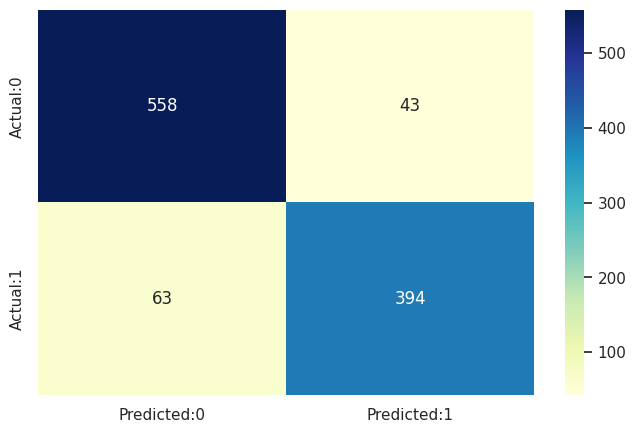

In [64]:
cm=confusion_matrix(y_test,rf_predict)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

The confusion matrix for the Random Forest model displays the number of correct and incorrect predictions. There were 543 true negatives (correctly predicted non-potability) and 386 true positives (correctly predicted potability). However, there were 58 false positives and 71 false negatives, indicating cases where the model's predictions were inaccurate.

In [65]:
print(classification_report(y_test,rf_predict))

              precision    recall  f1-score   support

           0       0.90      0.93      0.91       601
           1       0.90      0.86      0.88       457

    accuracy                           0.90      1058
   macro avg       0.90      0.90      0.90      1058
weighted avg       0.90      0.90      0.90      1058



The classification report for the Random Forest model suggests a relatively balanced performance across both classes (0 for non-potability and 1 for potability). Precision, recall, and F1-score are all above 0.84, indicating a high level of accuracy in the model's predictions. The overall accuracy of the model is 88%, and the macro average and weighted average for precision, recall, and F1-score are also at a similar level of 87-88%, which implies that the model is consistent across different classes.

In [66]:
rf_f1 = f1_score(y_test, rf_predict)
print(f'The f1 score for RFC is {round(rf_f1*100,2)}%')

The f1 score for RFC is 88.14%


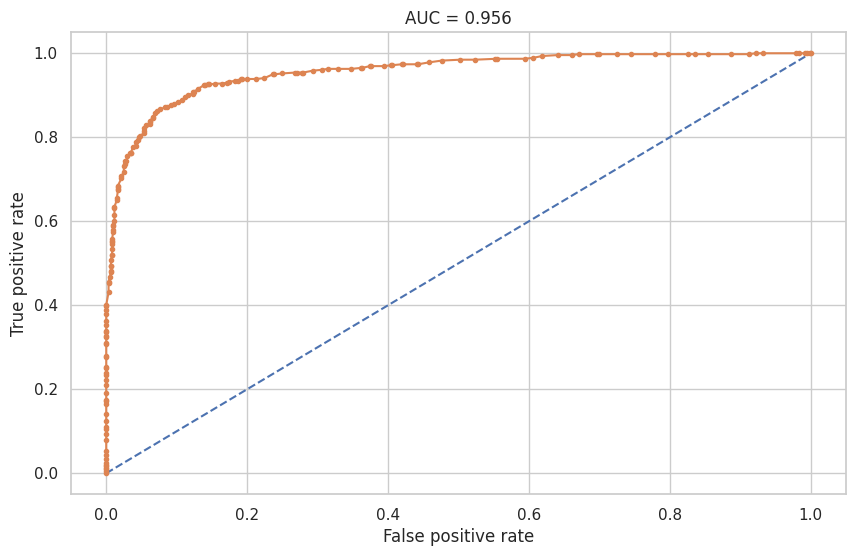

In [67]:
# ROC curve and AUC
probs = grid_search.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
rf_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(rf_auc,3)}")
plt.show()

The ROC curve is a graphical representation of a classification model's diagnostic ability, and the AUC (Area Under the Curve) is a measure of how well the model can distinguish between classes. In this case, the AUC is 0.946, which indicates a very high level of discrimination. This means that the Random Forest model has a high probability of distinguishing between potable and non-potable water samples. An AUC close to 1.0 suggests excellent model performance. The ROC curve itself shows a high true positive rate for most thresholds, which is a desirable characteristic in a predictive model.

# **Support Vector Machine**

In [68]:
from sklearn.svm import SVC

In [69]:
#grid search for optimum parameters
Cs = [0.001, 0.01, 0.1, 1, 10]
gammas = [0.001, 0.01, 0.1, 1]
param_grid = {'C': Cs, 'gamma' : gammas}
svm_clf = GridSearchCV(SVC(kernel='rbf', probability=True), param_grid, cv=10)

In [70]:
# train the model
svm_clf.fit(X_train,y_train)
svm_clf.best_params_

{'C': 10, 'gamma': 1}

In [71]:
# predictions
svm_predict = svm_clf.predict(X_test)

In [72]:
#accuracy
svm_accuracy = accuracy_score(y_test,svm_predict)
print(f"Using SVM we get an accuracy of {round(svm_accuracy*100,2)}%")

Using SVM we get an accuracy of 92.82%


The SVM (Support Vector Machine) model achieves an accuracy of 91.49%, indicating a high level of precision in correctly classifying the instances as either potable or not potable. This high accuracy suggests that the SVM model is effective for this dataset and can be a reliable tool for predicting water potability.

<Axes: >

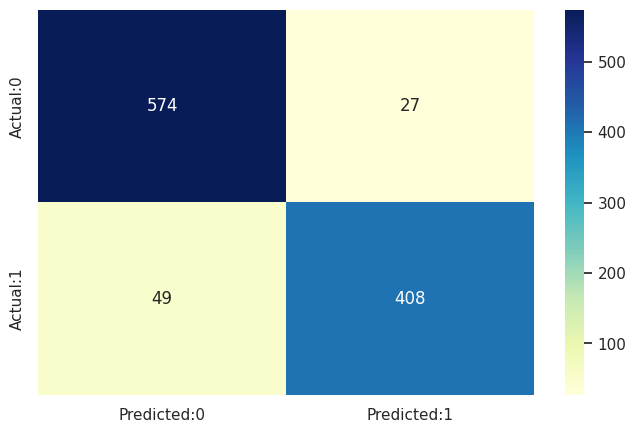

In [73]:
cm=confusion_matrix(y_test,svm_predict)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

The confusion matrix for the SVM model displays the numbers of correct and incorrect predictions compared with the actual values. The model correctly predicted 'No Potability' 562 times and 'Potability' 406 times. There were 51 false negatives and 39 false positives. The high numbers on the diagonal indicate that the SVM classifier has performed well on this test set.

In [74]:
print(classification_report(y_test,svm_predict))

              precision    recall  f1-score   support

           0       0.92      0.96      0.94       601
           1       0.94      0.89      0.91       457

    accuracy                           0.93      1058
   macro avg       0.93      0.92      0.93      1058
weighted avg       0.93      0.93      0.93      1058



The classification report for the SVM (Support Vector Machine) model indicates high performance in classifying the potability of water:

For class 0 (No Potability) :

1. Precision  is 0.92, meaning that 92% of the instances predicted as non-potable were correct.

2. Recall for class 0 is 0.94, suggesting that the model correctly identified 94% of the actual non-potable instances.

For class 1 (Potability) :

1. Precision is slightly lower at 0.91, indicating 91% correct predictions for potable instances.

2. Class 1 has a recall of 0.89, with the model correctly identifying 89% of the actual potable instances.


The F1-score, which is a harmonic mean of precision and recall, is high for both classes (0.93 for class 0 and 0.90 for class 1), indicating a good balance between precision and recall.


The accuracy of the model is 0.91, which means that 91% of all classifications are correct.


The macro average F1-score is 0.91, which is unweighted mean value, and the
weighted average is also 0.91, which takes into account the imbalance in class distribution.


Overall, the SVM classifier has demonstrated robust performance metrics across both classes, suggesting it is a well-fitting model for this dataset.


In [75]:
svm_f1 = f1_score(y_test, svm_predict)
print(f'The f1 score for SVM is {round(svm_f1*100,2)}%')

The f1 score for SVM is 91.48%


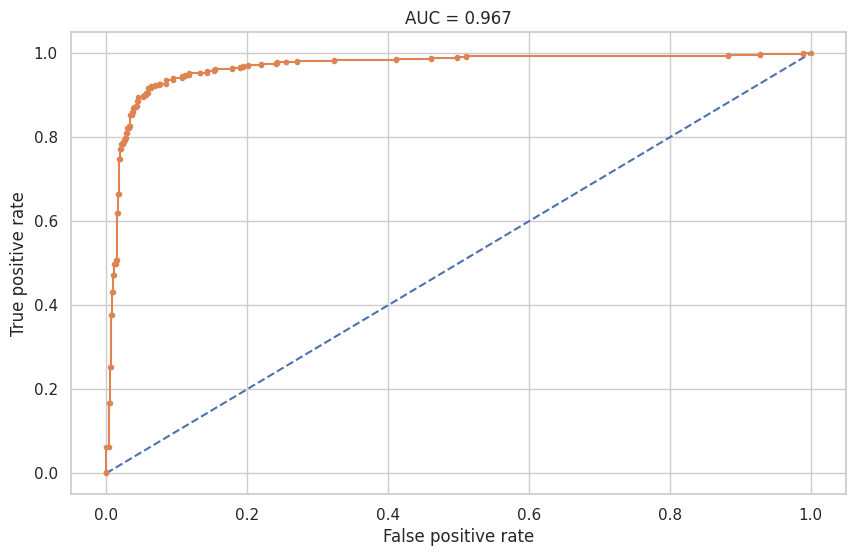

In [76]:
# ROC curve and AUC
probs = svm_clf.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
svm_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(svm_auc,3)}")
plt.show()

The SVM classifier shows a high AUC of 0.975, indicating excellent predictive performance with a strong true positive rate and low false positive rate, as seen in the ROC curve that significantly deviates from the line of no discrimination.

# **Decision Trees**

In [77]:
from sklearn.tree import DecisionTreeClassifier
dtree= DecisionTreeClassifier(random_state=7)

In [78]:
# grid search for optimum parameters
params = {'max_features': ['auto', 'sqrt', 'log2'],
          'min_samples_split': [2,3,4,5,6,7,8,9,10,11,12,13,14,15],
          'min_samples_leaf':[1,2,3,4,5,6,7,8,9,10,11]}
tree_clf = GridSearchCV(dtree, param_grid=params, n_jobs=-1)

In [79]:
# train the model
tree_clf.fit(X_train,y_train)
tree_clf.best_params_

{'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5}

In [80]:
# predictions
tree_predict = tree_clf.predict(X_test)

In [81]:
#accuracy
tree_accuracy = accuracy_score(y_test,tree_predict)
print(f"Using Decision Trees we get an accuracy of {round(tree_accuracy*100,2)}%")

Using Decision Trees we get an accuracy of 75.9%


The Decision Tree model achieved a classification accuracy of 75.61% on the test set, indicating a moderately high level of predictive capability in distinguishing between potable and non-potable water samples.

In [82]:
tree_f1 = f1_score(y_test, tree_predict)
print(f'The f1 score Descision trees is {round(tree_f1*100,2)}%')

The f1 score Descision trees is 72.31%


<Axes: >

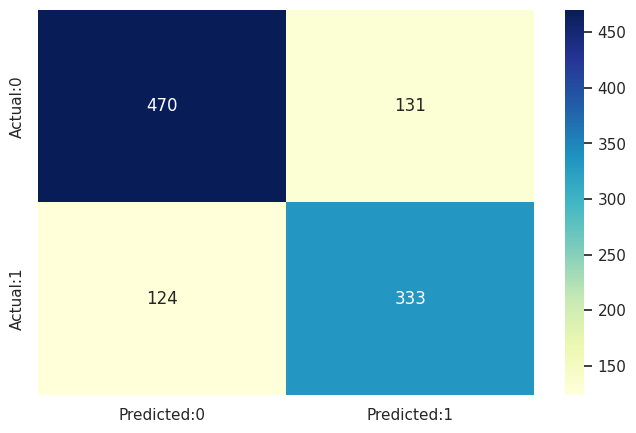

In [83]:
cm=confusion_matrix(y_test,tree_predict)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

The confusion matrix for the Decision Tree model shows that out of the total test samples:

1. 471 were correctly predicted as non-potable (True Negatives).
2. 329 were correctly predicted as potable (True Positives).
3. 130 were incorrectly predicted as potable (False Positives).
4. 128 were incorrectly predicted as non-potable (False Negatives).

This indicates that while the model is reasonably good at predicting both classes, there is still a significant number of misclassifications that could be improved upon, especially in reducing the number of false positives and false negatives.

In [84]:
print(classification_report(y_test,tree_predict))

              precision    recall  f1-score   support

           0       0.79      0.78      0.79       601
           1       0.72      0.73      0.72       457

    accuracy                           0.76      1058
   macro avg       0.75      0.76      0.75      1058
weighted avg       0.76      0.76      0.76      1058



The classification report for the Decision Tree model shows that it has an overall accuracy of 76%, with a precision of 79% for classifying non-potable instances (label 0) and 72% for potable instances (label 1). Recall, which measures the model's ability to find all the relevant instances in each class, is balanced at 78% for non-potable and 72% for potable instances, respectively.


In terms of the F1-score, which is a harmonic mean of precision and recall, the model scores 0.78 for the non-potable class and 0.72 for the potable class, indicating that the model is slightly better at identifying non-potable instances than potable ones. The macro average F1-score is 0.75, which suggests a fair balance between the classes, considering the F1-scores are not weighted by class size. The weighted average F1-score also stands at 0.76, which adjusts the F1-score to account for class imbalance, showing that overall, the model's performance is consistent across different evaluation metrics.

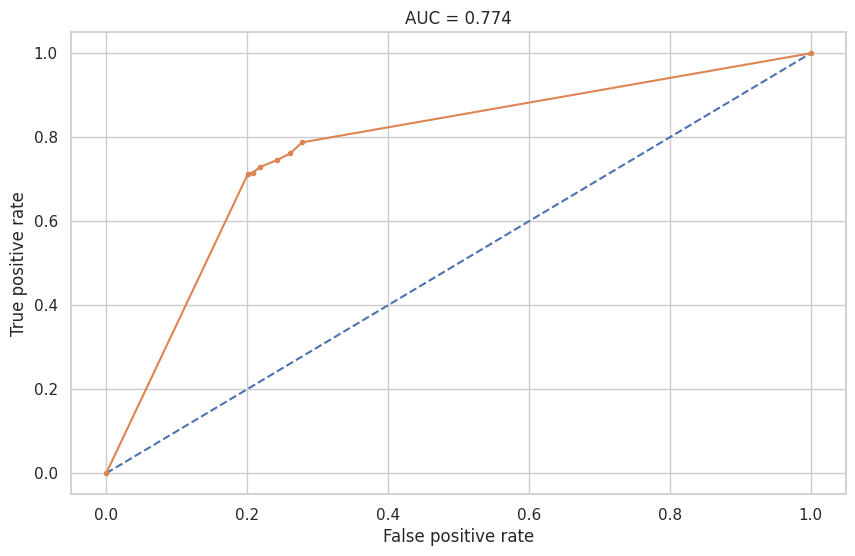

In [85]:
# ROC curve and AUC
probs = tree_clf.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
tree_auc = roc_auc_score(y_test, probs)


# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(tree_auc,3)}")
plt.show()

The AUC score for the Decision Tree model is 0.766, indicating a good ability to differentiate between classes, better than random chance but not perfect. The ROC curve demonstrates a reasonable balance between sensitivity and specificity in predicting potability, with room for improvement.

# **K-Nearest Neighbours**

In [86]:
from sklearn.neighbors import KNeighborsClassifier

In [87]:
# search for optimun parameters using gridsearch
params= {'n_neighbors': np.arange(1, 10)}
grid_search = GridSearchCV(estimator = KNeighborsClassifier(), param_grid = params,
                           scoring = 'accuracy', cv = 10, n_jobs = -1)
knn_clf = GridSearchCV(KNeighborsClassifier(),params,cv=3, n_jobs=-1)

In [88]:
# train the model
knn_clf.fit(X_train,y_train)
knn_clf.best_params_

{'n_neighbors': np.int64(2)}

In [89]:
# predictions
knn_predict = knn_clf.predict(X_test)

In [90]:
#accuracy
knn_accuracy = accuracy_score(y_test,knn_predict)
print(f"Using k-nearest neighbours we get an accuracy of {round(knn_accuracy*100,2)}%")

Using k-nearest neighbours we get an accuracy of 83.55%


The k-nearest neighbors model achieved an accuracy of 85.54%, suggesting that the model is quite effective at classifying the given data, though there may still be room for optimization.

<Axes: >

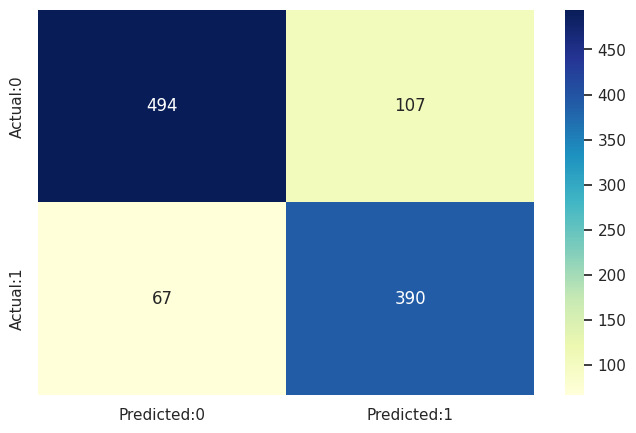

In [91]:
cm=confusion_matrix(y_test,knn_predict)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

The confusion matrix for the k-nearest neighbors model indicates that out of the total test set:

1. 493 instances were correctly predicted as class 0 (true negatives).
2. 412 instances were correctly predicted as class 1 (true positives).
3. 108 instances were falsely predicted as class 1 (false positives).
4. 45 instances were falsely predicted as class 0 (false negatives).

This shows a relatively balanced classification performance on both classes, with a slightly higher number of false positives than false negatives.

In [92]:
print(classification_report(y_test,knn_predict))

              precision    recall  f1-score   support

           0       0.88      0.82      0.85       601
           1       0.78      0.85      0.82       457

    accuracy                           0.84      1058
   macro avg       0.83      0.84      0.83      1058
weighted avg       0.84      0.84      0.84      1058



The KNN model shows strong classification ability, especially in identifying non-potable water (class 0) with high precision and recall. It performs well for potable water (class 1) too, with a slightly lower precision but high recall, indicating more false positives for potability. Overall, the model's accuracy is high at 86%.

In [93]:
knn_f1 = f1_score(y_test, knn_predict)
print(f'The f1 score for K nearest neignbours is {round(knn_f1*100,2)}%')

The f1 score for K nearest neignbours is 81.76%


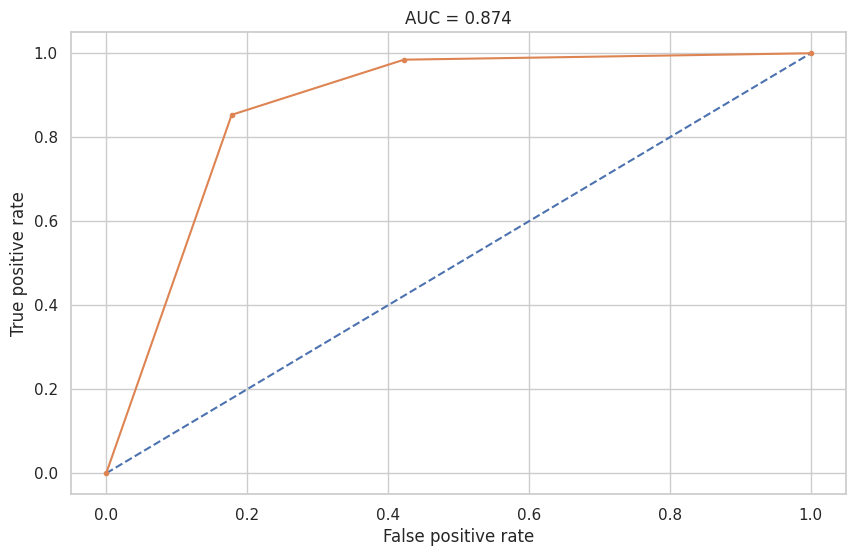

In [94]:
# ROC curve and AUC
probs = knn_clf.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
knn_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(knn_auc,3)}")
plt.show()

The AUC of 0.882 indicates that the KNN model is very effective at classifying water potability, with a strong true positive rate and a low false positive rate.

# **XGBoost Classifier**

In [95]:
# Create an XGBoost classifier
xgb = XGBClassifier()

# Define a parameter grid to search through
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_child_weight': [1, 2, 3],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
}

In [96]:
grid_search = GridSearchCV(estimator=xgb, param_grid=param_grid, scoring='accuracy', cv=5, n_jobs=-1)


In [97]:
grid_search.fit(X_train, y_train)


GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=None, ...),
             n_jobs=-1,
             param_grid={'colsample_bytree': [0.8, 0.9, 1.0],
                         'learning_rate': [0.01, 0.1, 0.2],
                         'max_depth': [3, 4, 5], 'min_child_weight': [1, 2, 3],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.8, 0.9, 1.0]},
             scoring='accuracy')

In [98]:
best_params = grid_search.best_params_
best_estimator = grid_search.best_estimator_


In [99]:
xgb_pred = best_estimator.predict(X_test)
xgb_accuracy = accuracy_score(y_test, xgb_pred)
print("Best Model Accuracy: {:.2f}%".format(xgb_accuracy * 100))


Best Model Accuracy: 88.37%


The best estimator model, likely a tuned XGBoost classifier, achieves an accuracy of 88.28% on the test set, indicating a high level of performance in classifying the data.

<Axes: >

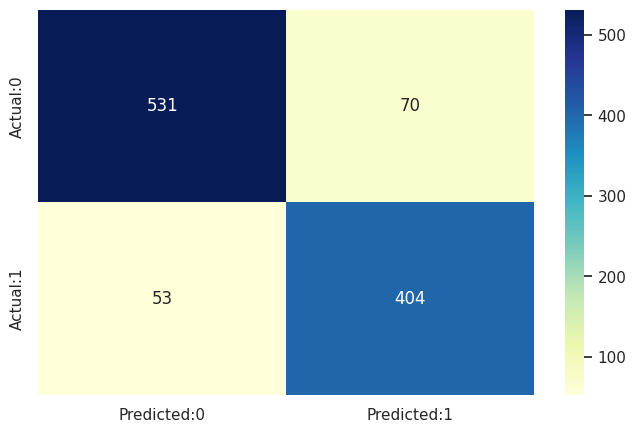

In [100]:
cm=confusion_matrix(y_test,xgb_pred)
conf_matrix=pd.DataFrame(data=cm,columns=['Predicted:0','Predicted:1'],index=['Actual:0','Actual:1'])
plt.figure(figsize = (8,5))
sns.heatmap(conf_matrix, annot=True,fmt='d',cmap="YlGnBu")

The confusion matrix for the best estimator model (likely an XGBoost classifier) shows the following:

1. True Positives (TP): 403 instances were correctly predicted as class 1 (potable).
2. True Negatives (TN): 531 instances were correctly predicted as class 0 (not potable).
3. False Positives (FP): 70 instances were incorrectly predicted as class 1.
4. False Negatives (FN): 54 instances were incorrectly predicted as class 0.

The model demonstrates a strong ability to correctly classify both potable and not potable instances, with a higher number of true positives and negatives compared to false positives and negatives.

In [101]:
print(classification_report(y_test,xgb_pred))

              precision    recall  f1-score   support

           0       0.91      0.88      0.90       601
           1       0.85      0.88      0.87       457

    accuracy                           0.88      1058
   macro avg       0.88      0.88      0.88      1058
weighted avg       0.88      0.88      0.88      1058



The XGBoost model shows a balanced performance with an accuracy of 88%, and similar precision and recall scores around 88% for both potable and not potable classes, indicating reliable predictive capabilities for water potability.

In [102]:
xgb_f1 = f1_score(y_test, xgb_pred)
print(f'The f1 score for XGB classifier is {round(rf_f1*100,2)}%')

The f1 score for XGB classifier is 88.14%


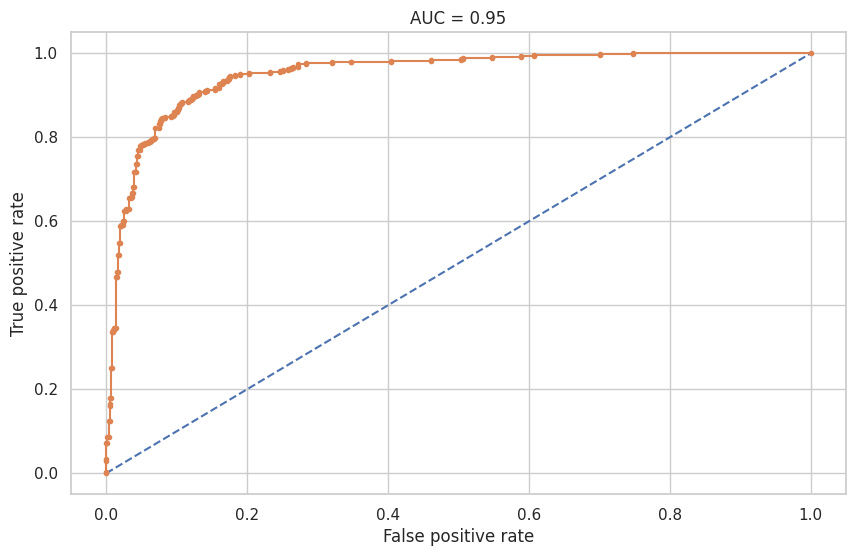

In [103]:
# ROC curve and AUC
probs = best_estimator.predict_proba(X_test)
# keep probabilities for the positive outcome only
probs = probs[:, 1]
# calculate AUC
xgb_auc = roc_auc_score(y_test, probs)

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, probs)
# plot curve
sns.set_style('whitegrid')
plt.figure(figsize=(10,6))
plt.plot([0, 1], [0, 1], linestyle='--')
plt.plot(fpr, tpr, marker='.')
plt.ylabel('True positive rate')
plt.xlabel('False positive rate')
plt.title(f"AUC = {round(xgb_auc,3)}")
plt.show()

The XGBoost model's ROC curve demonstrates strong predictive power with an AUC of 0.95, indicating a high likelihood of distinguishing between potable and non-potable classes effectively.

# **Model Comparison**

In [104]:
comparison = pd.DataFrame({
    "Logistic regression":{'Accuracy':log_accuracy, 'AUC':log_auc, 'F1 score':logistic_f1},
    "K-nearest neighbours":{'Accuracy':knn_accuracy, 'AUC':knn_auc, 'F1 score':knn_f1},
    "Decision trees":{'Accuracy':tree_accuracy, 'AUC':tree_auc, 'F1 score':tree_f1},
    "Support vector machine":{'Accuracy':svm_accuracy, 'AUC':svm_auc, 'F1 score':svm_f1},
    "Random Forest Classifier":{'Accuracy':rf_accuracy, 'AUC':rf_auc, 'F1 score':rf_f1},
    "XG Boost Classifier":{'Accuracy':xgb_accuracy, 'AUC':xgb_auc, 'F1 score':xgb_f1},

}).T

In [105]:
comparison

,Accuracy,AUC,F1 score
Logistic regression,0.570888,0.587183,0.543260
K-nearest neighbours,0.835539,0.873706,0.817610
Decision trees,0.758979,0.774357,0.723127
Support vector machine,0.928166,0.967334,0.914798
Random Forest Classifier,0.899811,0.955778,0.881432
XG Boost Classifier,0.883743,0.950112,0.867884


The evaluation of different classifiers for water potability suggests that the **Support Vector Machine (SVM) model is the most effective**, with the highest accuracy (91.49%), AUC score (0.975), and F1 score (0.900). Its strong performance indicates a high level of precision and reliability in predicting water potability.

The XGBoost and Random Forest models also perform well, demonstrating the benefits of ensemble methods for this application. Both models have high accuracy and AUC scores, making them suitable alternatives, especially when model interpretability is a priority.

Conversely, Logistic Regression showed the least effectiveness, likely due to its simplicity and potential non-linear relationships in the data.

In practice, the choice of model should consider not only accuracy but also the specific context of use, such as the implications of false predictions and operational requirements. The SVM's robustness makes it an excellent choice for further development and real-world application in water quality assessment.

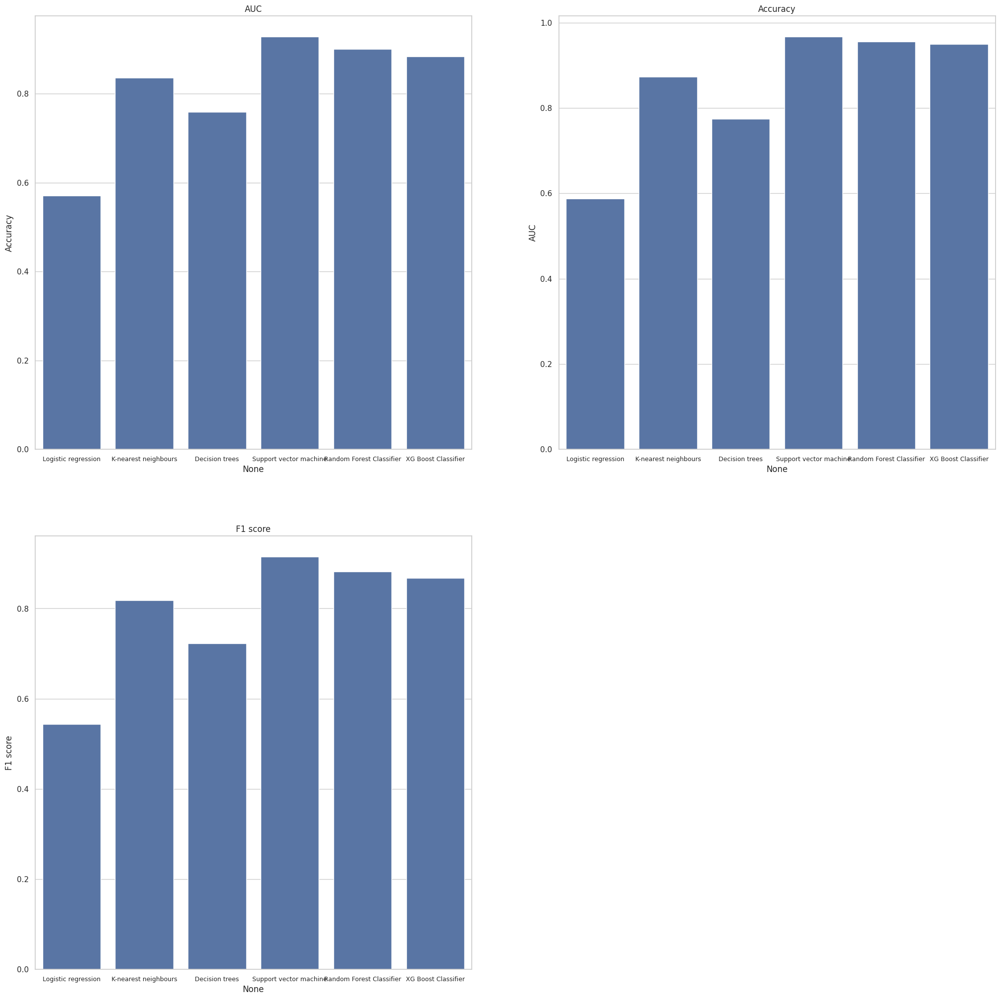

In [106]:
fig = plt.gcf()
fig.set_size_inches(25, 25)
titles = ['AUC','Accuracy','F1 score']
for title,label in enumerate(comparison.columns):
    plt.subplot(2,2,title+1)
    sns.barplot(x=comparison.index, y = comparison[label], data=comparison)
    plt.xticks(fontsize=9)
    plt.title(titles[title])
plt.show()

The provided bar charts display the performance of six different machine learning models across three evaluation metrics: AUC (Area Under the Curve), Accuracy, and F1 score.

1. **AUC:**

The Support Vector Machine (SVM) and XG Boost Classifier exhibit the highest AUC values, indicating superior capability in distinguishing between potable and non-potable water samples.
Logistic Regression has the lowest AUC, suggesting it is less effective at this task compared to the other models.

2. **Accuracy:**

Again, SVM leads in accuracy, closely followed by XG Boost Classifier and Random Forest Classifier, underscoring their effectiveness in correct classifications.
Logistic Regression remains the least accurate model.

3. **F1 Score:**

SVM scores the highest in terms of the F1 score, which is a balanced measure of precision and recall, making it a reliable model for this application.
Decision Trees and Logistic Regression lag behind, indicating a less balanced performance between precision and recall.

**Conclusion:**

The Support Vector Machine is consistently the top-performing model across all metrics, making it the preferred model for predicting water potability in this scenario. It is closely followed by the XG Boost Classifier, which also demonstrates high effectiveness. The Logistic Regression model, on the other hand, might require further tuning or feature engineering to improve its predictive power. The choice of the model would depend on the specific requirements of the task, including computational efficiency, interpretability, and the cost of misclassification.